In [ ]:
!pip3 install backtrader[plotting]
!pip3 install pyfolio

     |████████████████████████████████| 410 kB 5.5 MB/s 
     |████████████████████████████████| 91 kB 4.0 MB/s 
     |████████████████████████████████| 52 kB 1.3 MB/s 
  Created wheel for pyfolio: filename=pyfolio-0.9.2-py3-none-any.whl size=88681 sha256=69b22ed8342e7c2021c009cc6b602460a00f4ac03a65b774c822b67d7ce347fb
  Stored in directory: /root/.cache/pip/wheels/e4/96/9b/0dfff5453e702fd780a099b7c850521099c5ec0dfafae189f9
  Created wheel for empyrical: filename=empyrical-0.5.5-py3-none-any.whl size=39777 sha256=45e6fdea49a9ab4687be06a7686db8805e05a7941ecd70b6179b5f44baeee2f6
  Stored in directory: /root/.cache/pip/wheels/d9/91/4b/654fcff57477efcf149eaca236da2fce991526cbab431bf312
Successfully built pyfolio empyrical


In [ ]:
import matplotlib.pyplot as plt
from datetime import datetime
import backtrader as bt
import pandas as pd
import numpy as np
import math 
import statistics
from sklearn.metrics import mean_squared_error, mean_absolute_error
import scipy.stats as st
import datetime as dt
import pyfolio as pf
from scipy.optimize import minimize

from sklearn.linear_model import LinearRegression

# Connect to google drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


/usr/local/lib/python3.7/dist-packages/pyfolio/pos.py:27: UserWarning: Module "zipline.assets" not found; mutltipliers will not be applied to position notionals.
  'Module "zipline.assets" not found; mutltipliers will not be applied' +


Mounted at /content/drive


# Build Timeseries

In [ ]:
def build_timeseries(mat, input_cols, output_col, time_steps, target_time_steps):
    # input_cols is a list of columns that would act as input columns
    # output_col is the column that would act as output column
    # total number of time-series samples = len(mat) - time_steps - target_time_steps + 1
    dim_0 = mat.shape[0] - time_steps - target_time_steps + 1
    dim_1 = len(input_cols)
    
    x = np.zeros((dim_0, time_steps))
    y = np.zeros((dim_0,))
    
    for i in range(dim_0):  
        x[i] = mat[i: time_steps + i]
        y[i] = mat[time_steps + target_time_steps + i - 1]

    return x, y

def convert_price(pred, sc, feature_num, out_col):
# Return predicted price for given input
    pred_reverted = np.zeros(shape=(pred.shape[0], feature_num))
    pred_reverted[:, out_col] = pred
    pred_reverted = sc.inverse_transform(pred_reverted)
    predicted_price = pred_reverted[:, out_col]
    return predicted_price

In [ ]:
TIME_STEPS = 24 # How far in the past you want to use past data as features
TARGET_TIME_STEPS = 12 # How far in the future you want to make predictions
#INP_COLS = [0, 1, 2, 3, 4]
INP_COLS = [1]
OUT_COL = 1

In [ ]:
# Expected growth function

def growth_function(f, p, q, risk_free, mu, sigma):
  return -1 * (p * (math.log(1 + risk_free + f * (mu - risk_free + sigma) )) + q * (math.log(1 + risk_free + f * (mu - risk_free - sigma))) )

def optimal_f(p, q, risk_free, mu, sigma):
  #cons = ({'type': 'eq', 'fun': lambda x: 1 - sum(x)}) 
  bnds = [(0,1)]
  f = 0.5
  res = minimize(growth_function, x0 = f, args = (p, q, risk_free, mu, sigma), method = 'SLSQP', bounds = bnds, tol = 1e-30)
  return res

# Backtrader test using linear regression



In [ ]:
class Test_Strategy(bt.Strategy):
    params = dict(log_period = 1)

    def log(self, txt, dt=None):
        ''' Logging function fot this strategy'''
        dt = dt or self.datas[0].datetime.datetime(0)
        print('%s, %s' % (dt.isoformat(), txt))

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    'BUY EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                    (order.executed.price,
                     order.executed.value,
                     order.executed.comm))

                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else:  # Sell
                self.log('SELL EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                         (order.executed.price,
                          order.executed.value,
                          order.executed.comm))

            self.bar_executed = len(self)

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        # Write down: no pending order
        self.order = None
    def start(self):
        self.order = None 

    def __init__(self):
        self.data_close = self.datas[0].close
        self.log_return_list = []
        self.init_price = 0 
        self.current_f = 0
        self.reg = None
        self.sxx = np.zeros((TIME_STEPS, TIME_STEPS)) # S = S_xx
        self.sigma = 0
        self.x_mean = None
        self.dof = 0
        self.n = 0
        self.current_price = 0
        self.predicted_price = 0

    def next(self):
        # Simply log the closing price of the series from the reference
        #self.log('')
        if (len(self) == 1):
          self.init_price = self.datas[0].close.get(size = 1)
        
        
        if (len(self) == train_len):
          current_data = pd.Series(list(self.datas[0].close.get(size=train_len)))
          #print(current_data)
          #Build time series model for linear regression
          x_train_lr, y_train_lr = build_timeseries(mat=current_data.values, input_cols=INP_COLS, output_col=OUT_COL, 
                                          time_steps=TIME_STEPS, target_time_steps=TARGET_TIME_STEPS)
          
          # Train Linear Regression models
          self.reg = LinearRegression()
          self.reg.fit(x_train_lr, y_train_lr)

          self.n = len(x_train_lr) # n = number of training samples
          self.dof = self.n - TIME_STEPS - 1 # dof = Degree of Freedom

          # Calculate Sxx
          self.x_mean = x_train_lr.mean(axis=0)
          self.x_mean = self.x_mean.reshape((TIME_STEPS, 1))
          for x in x_train_lr:
              d = x.reshape((TIME_STEPS, 1)) - self.x_mean
              self.sxx += np.matmul(d, d.T)

          # Calculate estimated standard deviation
          pred_train = self.reg.predict(x_train_lr)
          sum = np.sum((y_train_lr - pred_train) ** 2) # sum = residual sum of squares
          self.sigma = np.sqrt(sum / self.dof) # sd = sigma, ie, estimated standard deviation

          #pred = reg.predict(x_test_lr)
        
        if (len(self) >= train_len + 60):
          current_data = pd.Series(list(self.datas[0].close.get(size=TIME_STEPS + TARGET_TIME_STEPS)))
          
          x_test_lr, y_test_lr = build_timeseries(mat=current_data.values, input_cols=INP_COLS, output_col=OUT_COL, 
                                          time_steps=TIME_STEPS, target_time_steps=TARGET_TIME_STEPS)
          
          pred = self.reg.predict(x_test_lr)
          self.log('')
          #print('Root Mean Squared Error =', math.sqrt(mean_squared_error(y_test_lr, pred)))
          #print('Mean Absolute Error =', mean_absolute_error(y_test_lr, pred))
          
          # Calculate standard error
          standard_error_lr = np.zeros(len(y_test_lr))
          for idx in range(len(standard_error_lr)):
              d = x_test_lr[idx].reshape((TIME_STEPS, 1)) - self.x_mean
              inversed_S = np.linalg.inv(self.sxx)
              standard_error_lr[idx] = self.sigma * np.sqrt(1 + 1/self.n + d.T @ inversed_S @ d)
          # np.matmul(np.matmul(d.T, inversed_S), d)
          # Calculate certainty level of prediction
          current_price_lr = pd.Series(list(self.datas[0].close.get(size=1)))
          current_date = self.datas[0].datetime.datetime(0)
          #time_data['predicted_price'].loc[current_date.strftime("%Y-%m-%d")] = self.predicted_price

          self.predicted_price = pred[0]
          diff_lr = np.abs(pred - current_price_lr)
          t_score = diff_lr / standard_error_lr
          probs_lr = st.t.cdf(t_score, self.dof) # probs_lr = estimated probability of correct trend prediction
          print('Today\'s price = ', current_price_lr[0])
          print('Predicted price = ', pred[0])
          print('Probability ', probs_lr[0])

          f_data = pd.Series(list(self.datas[0].close.get(size=30)))
          current_log = np.log(f_data/ f_data.shift(1))
          current_mu = (np.mean(current_log) * 252)
          print('Current mu = ', current_mu)
          current_sigma = (np.std(current_log) * 252 ** 0.5)
          print('Current sigma = ', current_sigma)
          if current_sigma != 0 and current_mu > 0:
            try :
              if pred - current_price_lr[0] > 0:
                print('up')
                current_f = optimal_f(probs_lr[0], 1 - probs_lr[0], 0, current_mu, current_sigma) 
                print('Current f', current_f.x[0])
                self.order = self.order_target_percent(target = current_f.x[0])
              else:
                print('down')
                current_f = optimal_f(1 - probs_lr[0], probs_lr[0], 0, current_mu, current_sigma) 
                print('Current f', current_f.x[0])
                self.order = self.order_target_percent(target = current_f.x[0])
                
            except:
              current_f = 0    
              print('Math error')
        '''
        if (len(self) >= 60):
            current_data = pd.Series(list(self.data_close.get(size=60)))
            current_ret = current_data.pct_change().dropna()
            current_log = np.log(current_data/ current_data.iloc[0])

            self.current_mu = (np.mean(current_log) * 252 )
            self.current_sigma = (np.std(current_log) * 252 ** 0.5)
            if self.current_sigma != 0 :
              self.current_f = 1/2 * (self.current_mu/(self.current_sigma ** 2))
            if self.current_f < 0 :
              self.current_f = 0
            elif self.current_f > 1 :
              self.current_f = 1
            print(self.current_f)
            #self.log('Current f %.4f' %self.current_f)
            self.order = self.order_target_percent(target = self.current_f)
            self.log('%04d - Order Target Percent: %.4f' %(len(self), self.current_f))
            #self.log(self.broker.getvalue())
            #self.log('Portfolio value %.2f' %data_value)
        '''


#Phase 1


## Cryptocurrency 

### USD - BTC

In [ ]:
btc_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/BTC-USD.csv', index_col=0, parse_dates=True)
btc_data.dropna(inplace=True)
train_len = int(0.7 * len(btc_data))
time_data = btc_data[train_len+59:].copy()
time_data['predicted_price'] = 0
print(train_len)

1276


In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=btc_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-01-24T00:00:00, 
Today's price =  8445.43457
Predicted price =  8185.369404102017
Probability  0.5835127845334573
Current mu =  1.3394887872699184
Current sigma =  0.4159424104002657
down
Current f 4.0
2020-01-25T00:00:00, Order Canceled/Margin/Rejected
2020-01-25T00:00:00, 
Today's price =  8367.847656
Predicted price =  8089.429743294319
Probability  0.5893077963572013
Current mu =  1.198138625896348
Current sigma =  0.4180207352887163
down
Current f 4.0
2020-01-26T00:00:00, Order Canceled/Margin/Rejected
2020-01-26T00:00:00, 
Today's price =  8596.830078
Predicted price =  8982.99673181085
Probability  0.6227500067430811
Current mu =  1.3995368113166617
Current sigma =  0.4229323149883411
up
Current f 4.0
2020-01-27T00:00:00, Order Canceled/Margin/Rejected
2020-01-27T00:00:00, 
Today's price =  8909.819336
Predicted price =  8773.779598456378
Probability  0.5438595823088622
Current mu =  1.5868826422275342
Current sigma =  0.4312905706761839

In [ ]:
time_data[:10]

,Open,High,Low,Close,Adj Close,Volume,predicted_price
Date,,,,,,,
2020-01-24,8405.567383,8514.666992,8266.840820,8445.434570,8445.434570,2.439791e+10,0
2020-01-25,8440.119141,8458.453125,8296.218750,8367.847656,8367.847656,1.964733e+10,0
2020-01-26,8364.410156,8602.401367,8325.498047,8596.830078,8596.830078,2.217768e+10,0
2020-01-27,8597.308594,8977.726563,8597.308594,8909.819336,8909.819336,2.864734e+10,0
2020-01-28,8912.524414,9358.589844,8908.447266,9358.589844,9358.589844,3.439874e+10,0
2020-01-29,9357.470703,9406.431641,9269.467773,9316.629883,9316.629883,3.068260e+10,0
2020-01-30,9316.016602,9553.125977,9230.897461,9508.993164,9508.993164,3.237879e+10,0
2020-01-31,9508.313477,9521.706055,9230.776367,9350.529297,9350.529297,2.943249e+10,0
2020-02-01,9346.357422,9439.323242,9313.239258,9392.875000,9392.875000,2.592266e+10,0


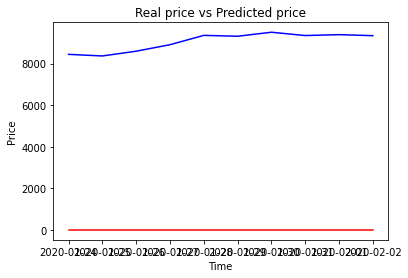

In [ ]:
# mean-var graph
plt.xlabel('Time')
plt.ylabel('Price')
plt.title('Real price vs Predicted price')
plt.plot(time_data['Close'].loc['2020-01-24':'2020-02-2'], color='blue')
plt.plot(time_data['predicted_price'].loc['2020-01-24':'2020-02-2'], color='red')
plt.show()

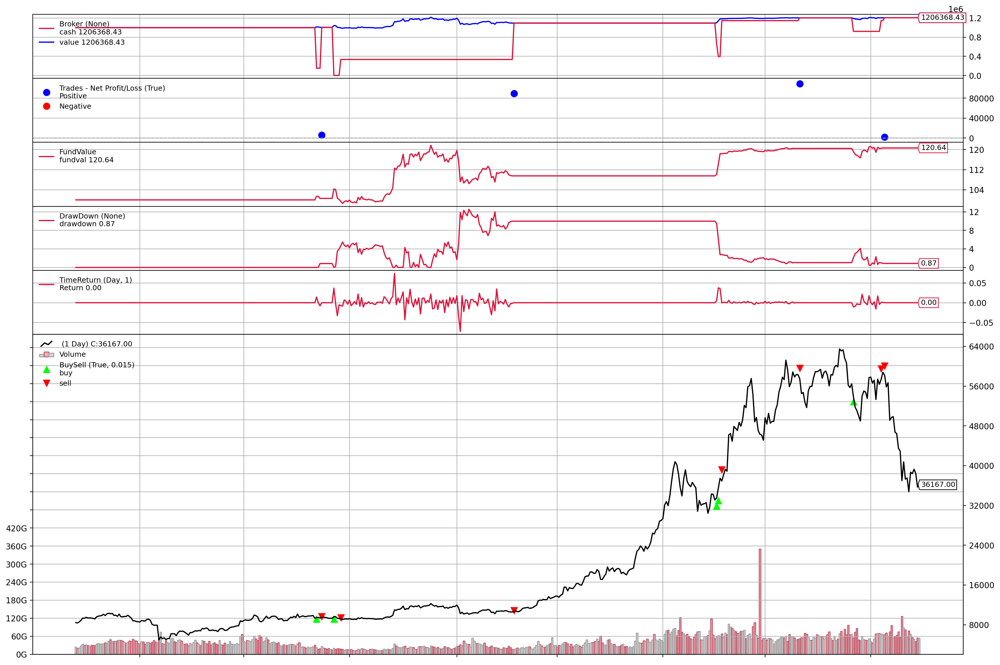

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 1, 24), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-1-24',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - ETH

In [ ]:
eth_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/ETH-USD.csv', index_col=0, parse_dates=True)
eth_data.dropna(inplace=True)
train_len = int(0.7 * len(eth_data))
time_data = eth_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len

1276

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=eth_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-01-24T00:00:00, 
Today's price =  163.051178
Predicted price =  157.2453467655138
Probability  0.5290486563536505
Current mu =  2.215162449461752
Current sigma =  0.5595571843833307
down
Current f 4.0
2020-01-25T00:00:00, Order Canceled/Margin/Rejected
2020-01-25T00:00:00, 
Today's price =  161.283936
Predicted price =  155.37732849614233
Probability  0.529551825734146
Current mu =  2.0619761845645317
Current sigma =  0.5624433745827309
down
Current f 4.0
2020-01-26T00:00:00, Order Canceled/Margin/Rejected
2020-01-26T00:00:00, 
Today's price =  168.077103
Predicted price =  179.7122470810857
Probability  0.5580349742952195
Current mu =  2.345116980574309
Current sigma =  0.5705504754017228
up
Current f 4.0
2020-01-27T00:00:00, Order Canceled/Margin/Rejected
2020-01-27T00:00:00, 
Today's price =  170.930893
Predicted price =  177.2118554187909
Probability  0.5314082404822789
Current mu =  2.066216748211526
Current sigma =  0.5586297245064796
up


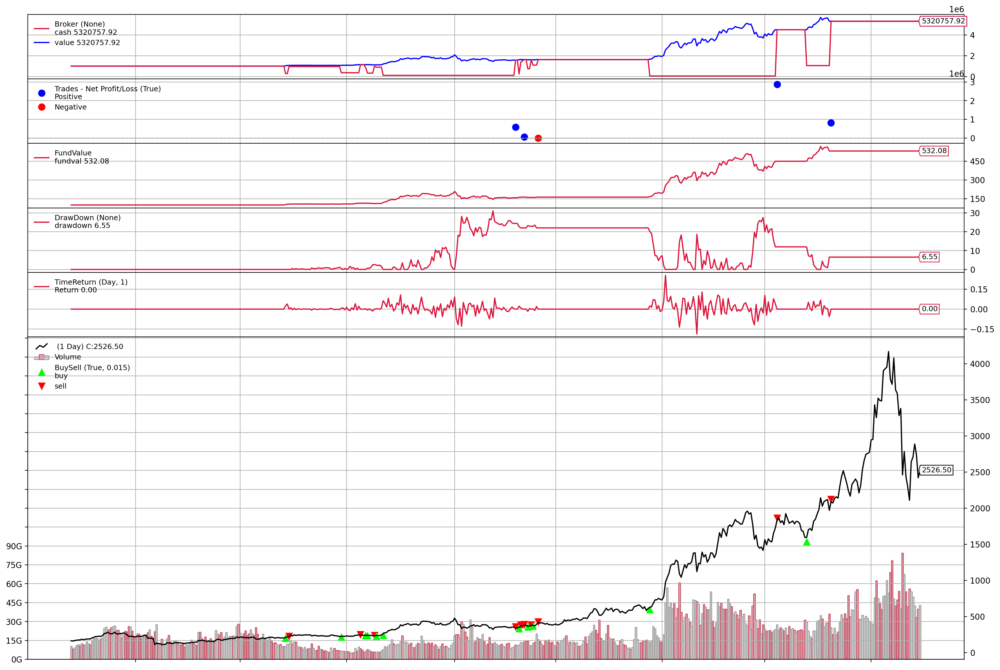

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 1, 24), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-1-24',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - DOGE

In [ ]:
doge_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/DOGE-USD.csv', index_col=0, parse_dates=True)
doge_data.dropna(inplace=True)
train_len = int(0.7 * len(doge_data))
time_data = doge_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len

1276

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=doge_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-01-24T00:00:00, 
Today's price =  0.0022760000000000002
Predicted price =  0.0024605940518201857
Probability  0.5708319365535981
Current mu =  0.8749168783021085
Current sigma =  0.5113853832092358
up
Current f 4.0
2020-01-25T00:00:00, Order Canceled/Margin/Rejected
2020-01-25T00:00:00, 
Today's price =  0.002257
Predicted price =  0.002471288482899863
Probability  0.5820753656373873
Current mu =  0.8232089196292315
Current sigma =  0.5122720931988204
up
Current f 4.0
2020-01-26T00:00:00, Order Canceled/Margin/Rejected
2020-01-26T00:00:00, 
Today's price =  0.002305
Predicted price =  0.002678507237336824
Probability  0.640987769409505
Current mu =  0.9596405815511203
Current sigma =  0.514837463907969
up
Current f 4.0
2020-01-27T00:00:00, Order Canceled/Margin/Rejected
2020-01-27T00:00:00, 
Today's price =  0.002368
Predicted price =  0.002537543529725338
Probability  0.5650970323190704
Current mu =  1.1771333660222503
Current sigma =  0.51913

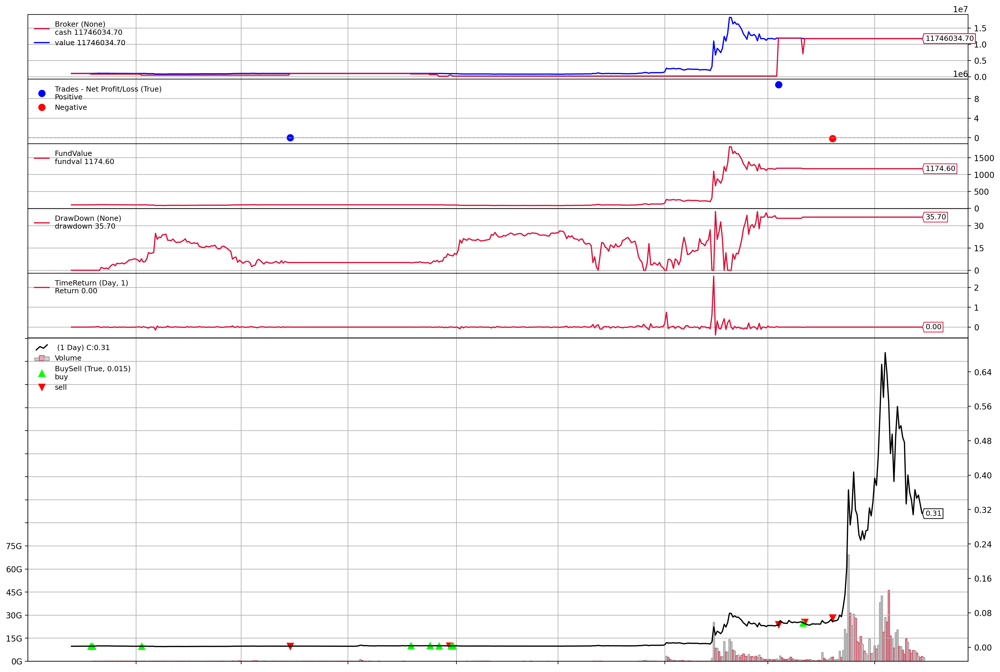

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 1, 24), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-1-24',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - XRP

In [ ]:
xrp_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/XRP-USD.csv', index_col=0, parse_dates=True)
xrp_data.dropna(inplace=True)
time_data = xrp_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(xrp_data))
train_len

1276

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=xrp_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-01-24T00:00:00, 
Today's price =  0.223041
Predicted price =  0.2346991513310724
Probability  0.5214531530935445
Current mu =  1.3752248432895893
Current sigma =  0.5649757158039704
up
Current f 4.0
2020-01-25T00:00:00, Order Canceled/Margin/Rejected
2020-01-25T00:00:00, 
Today's price =  0.220427
Predicted price =  0.2292178003408258
Probability  0.5161800093586923
Current mu =  1.2405287194470414
Current sigma =  0.567171655402724
up
Current f 4.0
2020-01-26T00:00:00, Order Canceled/Margin/Rejected
2020-01-26T00:00:00, 
Today's price =  0.230686
Predicted price =  0.25669266809682006
Probability  0.5477623961071981
Current mu =  1.5399606298906303
Current sigma =  0.5790550495063269
up
Current f 4.0
2020-01-27T00:00:00, Order Canceled/Margin/Rejected
2020-01-27T00:00:00, 
Today's price =  0.23122199999999998
Predicted price =  0.2590968806384737
Probability  0.5511751726194748
Current mu =  1.3896123721922486
Current sigma =  0.57771395190111

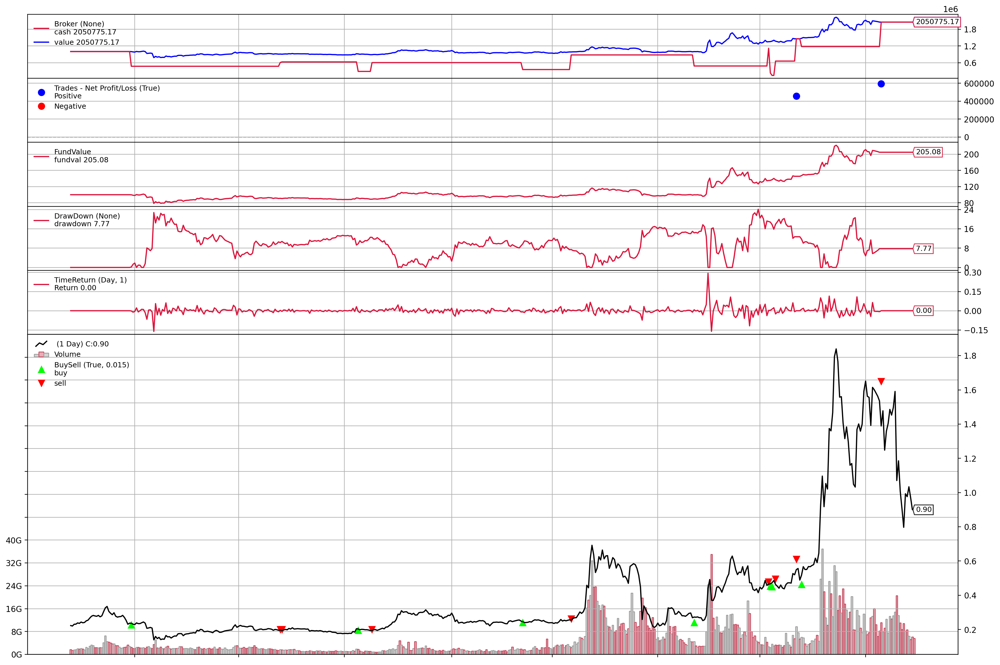

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 1, 24), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-1-24',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - LTC

In [ ]:
ltc_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/LTC-USD.csv', index_col=0, parse_dates=True)
ltc_data.dropna(inplace=True)
time_data = ltc_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(ltc_data))
train_len

1276

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=ltc_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-01-24T00:00:00, 
Today's price =  54.531788
Predicted price =  53.59691155616079
Probability  0.5145393676819126
Current mu =  2.635358981937691
Current sigma =  0.7004919649683243
down
Current f 4.0
2020-01-25T00:00:00, Order Canceled/Margin/Rejected
2020-01-25T00:00:00, 
Today's price =  53.697788
Predicted price =  50.83565947821133
Probability  0.5444287946034746
Current mu =  2.3067860537703866
Current sigma =  0.7034463726363064
down
Current f 4.0
2020-01-26T00:00:00, Order Canceled/Margin/Rejected
2020-01-26T00:00:00, 
Today's price =  56.212715
Predicted price =  61.32970799456226
Probability  0.5790141244649024
Current mu =  2.3602134284695238
Current sigma =  0.7059813788081893
up
Current f 4.0
2020-01-27T00:00:00, Order Canceled/Margin/Rejected
2020-01-27T00:00:00, 
Today's price =  58.763268000000004
Predicted price =  58.24459631391071
Probability  0.50806168380845
Current mu =  2.5794418546169684
Current sigma =  0.712767614529228

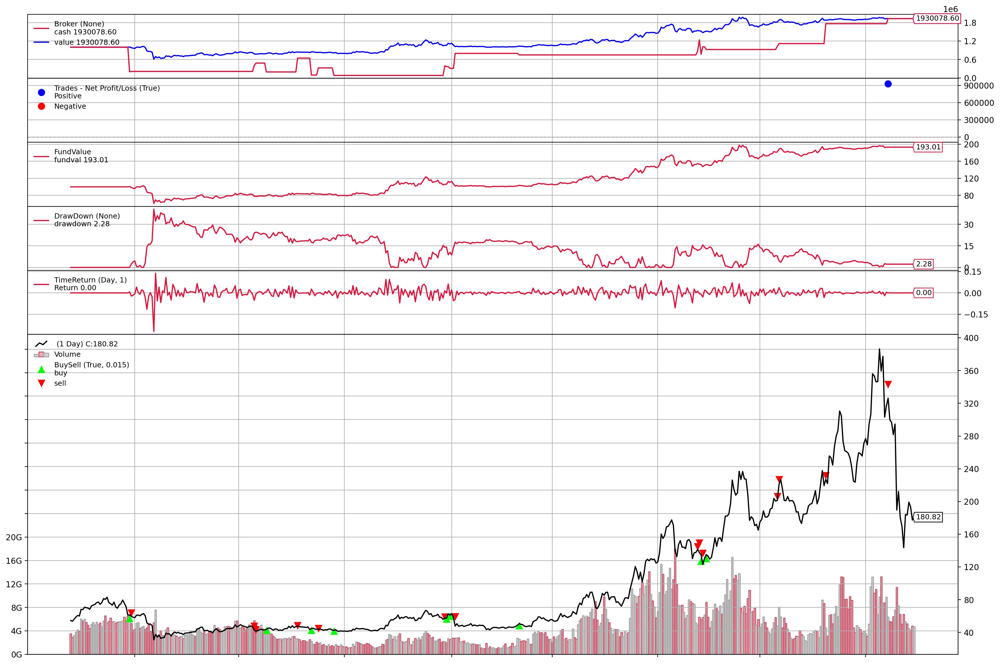

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 1, 24), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-1-24',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - BCH

In [ ]:
bch_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/BCH-USD.csv', index_col=0, parse_dates=True)
bch_data.dropna(inplace=True)
time_data = bch_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(bch_data))
train_len

982

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=bch_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-05-30T00:00:00, 
Today's price =  251.29952999999998
Predicted price =  286.96970830312
Probability  0.5548921310487595
Current mu =  -0.20262723692576798
Current sigma =  0.5609486166093691
2020-05-31T00:00:00, 
Today's price =  239.877029
Predicted price =  282.75226384914316
Probability  0.5658866346631896
Current mu =  -0.7658873672981664
Current sigma =  0.5730558762952663
2020-06-01T00:00:00, 
Today's price =  255.35218799999998
Predicted price =  279.94163545550236
Probability  0.5379029600300158
Current mu =  0.0960757301982157
Current sigma =  0.5941023784713753
up
Current f 0.4105355999758592
2020-06-02T00:00:00, BUY EXECUTED, Price: 255.35, Cost: 410350.97, Comm 0.00
2020-06-02T00:00:00, 
Today's price =  249.053223
Predicted price =  269.05171361029977
Probability  0.5308416749306213
Current mu =  0.12593751501792935
Current sigma =  0.5927368613522994
up
Current f 0.48438384482187175
2020-06-03T00:00:00, BUY EXECUTED, Price: 249.05

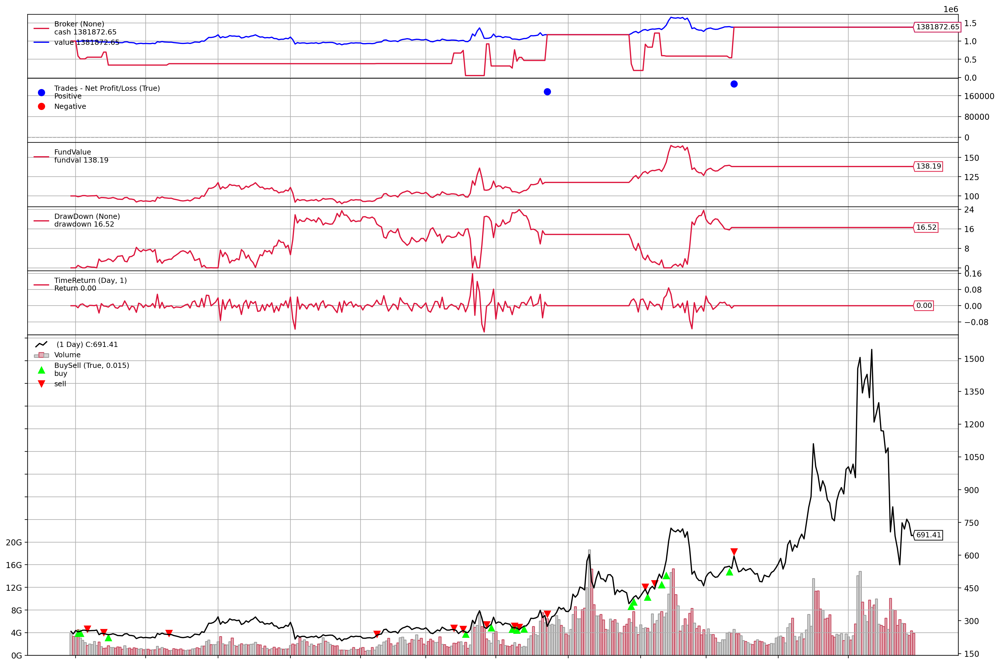

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 5, 30), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-5-30',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - ADA

In [ ]:
ada_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/ADA-USD.csv', index_col=0, parse_dates=True)
ada_data.dropna(inplace=True)
time_data = ada_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(ada_data))
train_len

933

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=ada_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-06-20T00:00:00, 
Today's price =  0.07933899999999999
Predicted price =  0.10409484332349045
Probability  0.6254350393565351
Current mu =  3.0532382443337065
Current sigma =  0.914196092522387
up
Current f 4.0
2020-06-21T00:00:00, Order Canceled/Margin/Rejected
2020-06-21T00:00:00, 
Today's price =  0.078475
Predicted price =  0.1024812211057552
Probability  0.6217576531012686
Current mu =  3.03798550725332
Current sigma =  0.914565706090335
up
Current f 4.0
2020-06-22T00:00:00, Order Canceled/Margin/Rejected
2020-06-22T00:00:00, 
Today's price =  0.08361
Predicted price =  0.10366705982524133
Probability  0.6022187188574295
Current mu =  4.020424044273946
Current sigma =  0.9068515221929464
up
Current f 4.0
2020-06-23T00:00:00, Order Canceled/Margin/Rejected
2020-06-23T00:00:00, 
Today's price =  0.08295
Predicted price =  0.09655309421118792
Probability  0.569738908265717
Current mu =  3.728299046639343
Current sigma =  0.9089400002770253
up


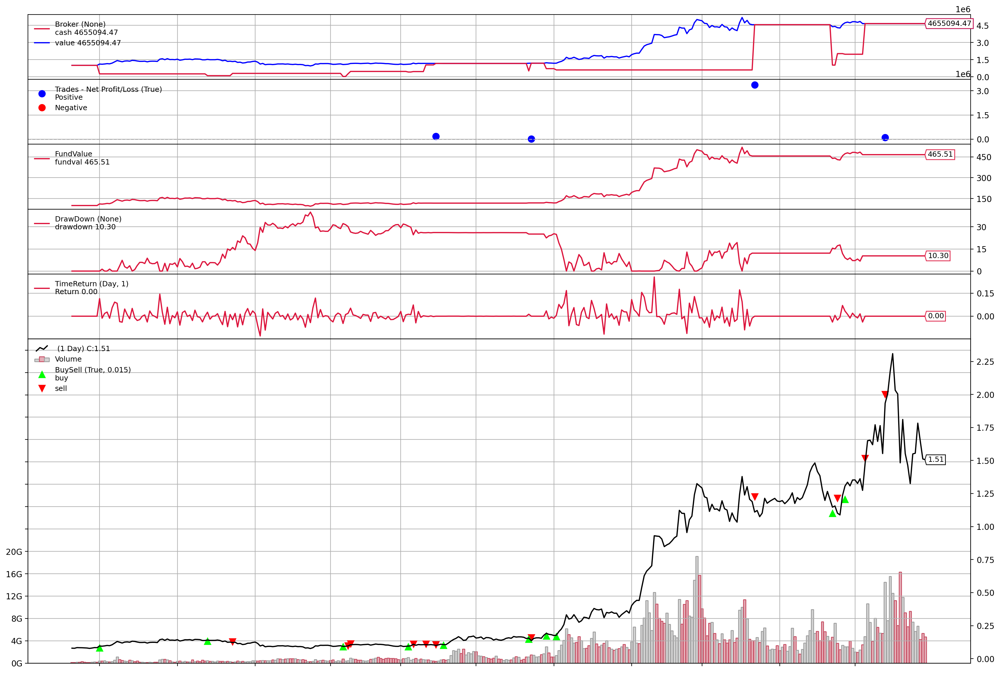

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 6, 20), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-6-20',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### USD - BNB

In [ ]:
bnb_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/BNB-USD.csv', index_col=0, parse_dates=True)
bnb_data.dropna(inplace=True)
time_data = bnb_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(bnb_data))
train_len

980

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=bnb_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-05-30T00:00:00, 
Today's price =  17.743418
Predicted price =  16.64428356470042
Probability  0.6408995753009483
Current mu =  0.08782411204241788
Current sigma =  0.47880619340339714
down
Current f 1.109138822452671e-16
2020-05-31T00:00:00, 
Today's price =  17.040472
Predicted price =  17.07835266679949
Probability  0.5049603252090225
Current mu =  -0.2732860590872549
Current sigma =  0.49313061535104835
2020-06-01T00:00:00, 
Today's price =  17.914942
Predicted price =  16.683821828000013
Probability  0.6569134952672329
Current mu =  0.39120721533391034
Current sigma =  0.5084890123885519
down
Current f 2.1951672848183823
2020-06-02T00:00:00, Order Canceled/Margin/Rejected
2020-06-02T00:00:00, 
Today's price =  17.239304
Predicted price =  16.034696602433613
Probability  0.6536619773632417
Current mu =  0.07011874046811038
Current sigma =  0.521509154768822
down
Current f 1.109138822452671e-16
2020-06-03T00:00:00, 
Today's price =  17.545404

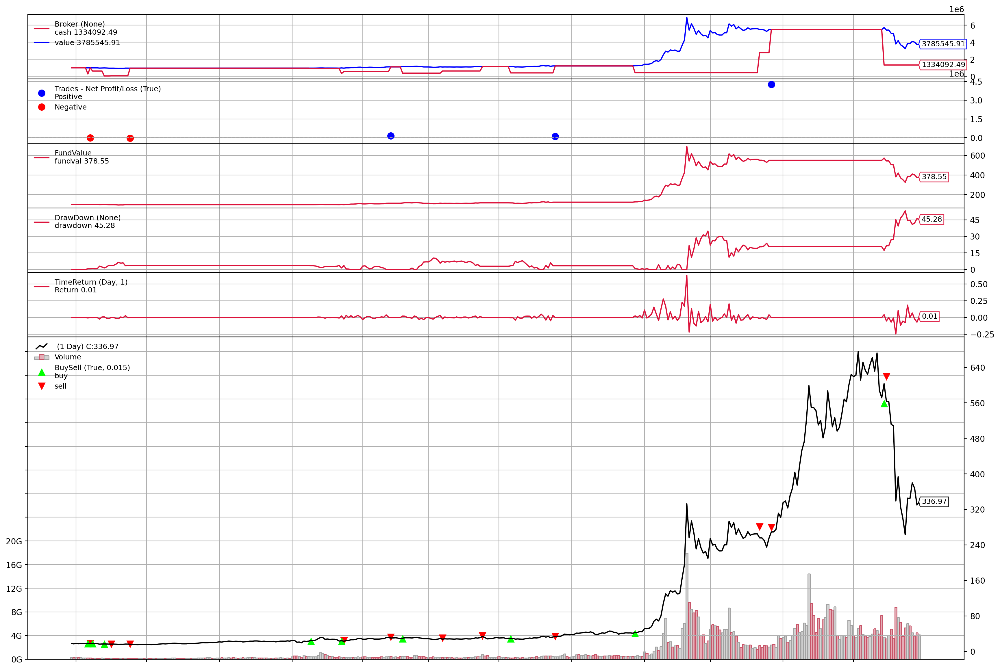

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 5, 30), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-5-30',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


## Stocks (S&P 500 big cap)

### Yahoo

In [ ]:
yahoo_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/yhoo-1996-2015.txt', index_col=0, parse_dates=True)
yahoo_data.dropna(inplace=True)
time_data = yahoo_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.9 * len(yahoo_data))
train_len

4468

In [ ]:
yahoo_data['2013']

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-01-02,20.200001,20.320000,20.010000,20.080000,20.080000,20463100
2013-01-03,20.049999,20.100000,19.719999,19.780001,19.780001,19504400
2013-01-04,19.760000,19.950001,19.719999,19.860001,19.860001,12489600
2013-01-07,19.559999,19.580000,19.280001,19.400000,19.400000,23864500
2013-01-08,19.320000,19.680000,19.299999,19.660000,19.660000,16931700
...,...,...,...,...,...,...
2013-12-24,40.910000,40.950001,40.660000,40.849998,40.849998,5113900
2013-12-26,41.000000,41.049999,40.220001,40.650002,40.650002,7364600
2013-12-27,40.720001,40.750000,40.320000,40.490002,40.490002,6138700


In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=yahoo_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2014-04-08T00:00:00, 
Today's price =  33.830002
Predicted price =  37.06214064070278
Probability  0.804525294168892
Current mu =  -0.9227349777808092
Current sigma =  0.318244751229447
2014-04-09T00:00:00, 
Today's price =  34.869999
Predicted price =  36.00450688404034
Probability  0.618338471807089
Current mu =  -0.8537752244384709
Current sigma =  0.3246454146881234
2014-04-10T00:00:00, 
Today's price =  33.400002
Predicted price =  35.479485401896554
Probability  0.7094968419482628
Current mu =  -1.2731048171459063
Current sigma =  0.34313560047360386
2014-04-11T00:00:00, 
Today's price =  32.869999
Predicted price =  35.138001719539275
Probability  0.7263963761834791
Current mu =  -1.317205764167666
Current sigma =  0.344203067331435
2014-04-14T00:00:00, 
Today's price =  33.450001
Predicted price =  35.41429419381551
Probability  0.6989376717825637
Current mu =  -1.4731973525334305
Current sigma =  0.3293799354333493
2014-04-15T00:00:00, 
Tod

In [ ]:
time_data

,Open,High,Low,Close,Adj Close,Volume,predicted_price
Date,,,,,,,
2000-05-24,58.750000,62.000000,56.000000,61.375000,61.375000,22729200,0
2000-05-25,60.750000,61.812500,56.500000,57.500000,57.500000,18788800,0
2000-05-26,57.250000,58.062500,55.500000,56.031250,56.031250,12662200,0
2000-05-30,57.843750,60.000000,57.250000,58.500000,58.500000,17734000,0
2000-05-31,56.875000,58.656250,56.406250,56.531250,56.531250,28353800,0
...,...,...,...,...,...,...,...
2015-12-24,34.189999,34.740002,34.099998,34.110001,34.110001,3470700,0
2015-12-28,33.900002,33.910000,33.349998,33.599998,33.599998,10869100,0
2015-12-29,33.630001,34.169998,33.599998,34.040001,34.040001,12621900,0


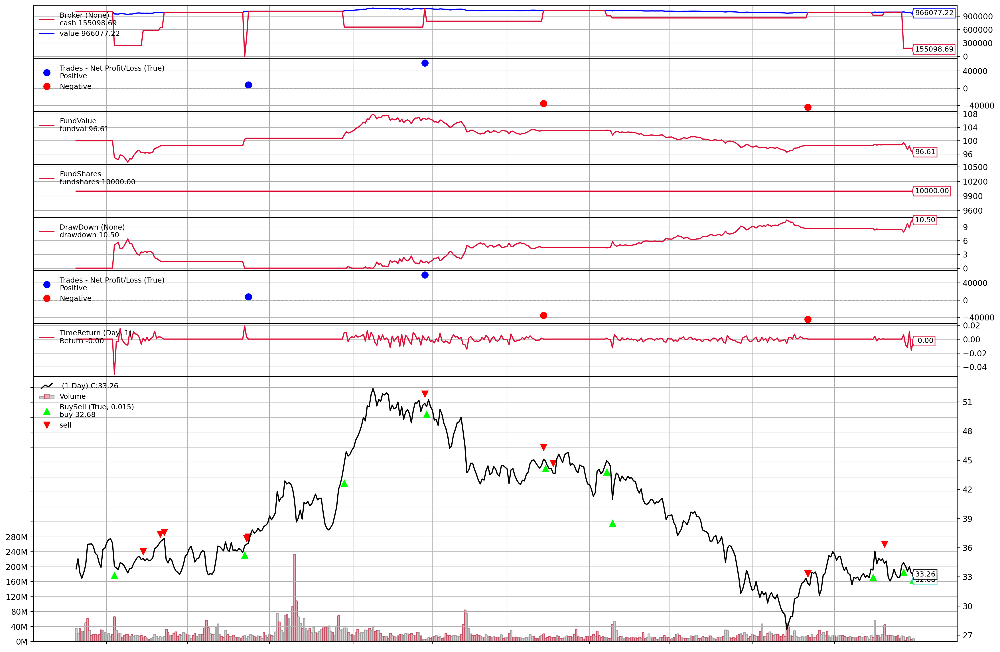

[[<Figure size 3600x2400 with 9 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2014, 4, 8), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2014-4-8',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### AAPL


In [ ]:
aapl_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/AAPL.csv', index_col=0, parse_dates=True)
aapl_data.dropna(inplace=True)
time_data = aapl_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.9 * len(aapl_data))
train_len

2264

In [ ]:
aapl_data.iloc[train_len:]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-05-11,77.025002,79.262497,76.809998,78.752502,78.225410,145946400
2020-05-12,79.457497,79.922501,77.727501,77.852501,77.331436,162301200
2020-05-13,78.037498,78.987503,75.802498,76.912498,76.397720,200622400
2020-05-14,76.127502,77.447502,75.382500,77.385002,76.867065,158929200
2020-05-15,75.087502,76.974998,75.052498,76.927498,76.412621,166348400
...,...,...,...,...,...,...
2021-05-04,131.190002,131.490005,126.699997,127.849998,127.633202,137564700
2021-05-05,129.199997,130.449997,127.970001,128.100006,127.882790,84000900
2021-05-06,127.889999,129.750000,127.129997,129.740005,129.520004,78128300


In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=aapl_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-08-04T00:00:00, 
Today's price =  109.665001
Predicted price =  97.74757708258409
Probability  0.9999999454421629
Current mu =  1.5610466842818997
Current sigma =  0.3890029888539857
down
Current f 4.0
2020-08-05T00:00:00, Order Canceled/Margin/Rejected
2020-08-05T00:00:00, 
Today's price =  110.0625
Predicted price =  99.34022252562252
Probability  0.9999991028113248
Current mu =  1.7472469900874747
Current sigma =  0.3824086583083958
down
Current f 4.0
2020-08-06T00:00:00, Order Canceled/Margin/Rejected
2020-08-06T00:00:00, 
Today's price =  113.902496
Predicted price =  97.71052483849533
Probability  0.9999999999996498
Current mu =  1.9306524222744827
Current sigma =  0.3902155542235782
down
Current f 4.0
2020-08-07T00:00:00, Order Canceled/Margin/Rejected
2020-08-07T00:00:00, 
Today's price =  111.112503
Predicted price =  98.1261077788362
Probability  0.9999999960222316
Current mu =  1.9863370763719659
Current sigma =  0.3850764768652157
d

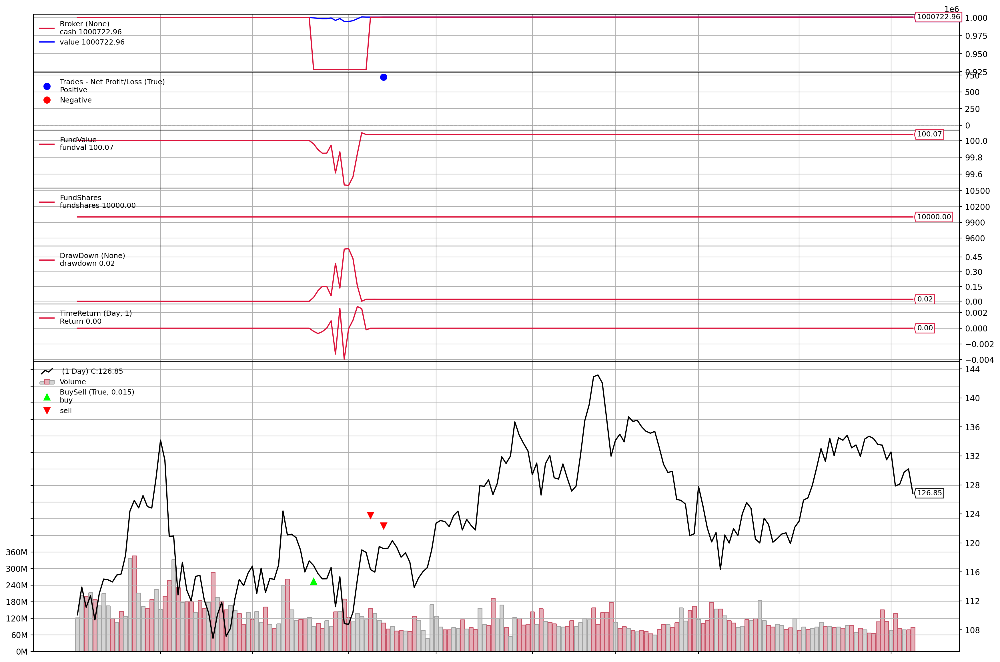

[[<Figure size 3600x2400 with 8 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2020, 8, 5), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-8-5',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### FB

In [ ]:
fb_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/FB.csv', index_col=0, parse_dates=True)
fb_data.dropna(inplace=True)
time_data = fb_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(fb_data))
train_len

1584

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=fb_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2018-11-28T00:00:00, 
Today's price =  136.759995
Predicted price =  147.2001284829777
Probability  0.9543924074863697
Current mu =  -1.3322517737029862
Current sigma =  0.38853687602776976
2018-11-29T00:00:00, 
Today's price =  138.679993
Predicted price =  145.0165813975315
Probability  0.8483878227224808
Current mu =  -0.9622904273010595
Current sigma =  0.38586799894081797
2018-11-30T00:00:00, 
Today's price =  140.610001
Predicted price =  144.79213019769057
Probability  0.7516517417167764
Current mu =  -0.7932537404887728
Current sigma =  0.38917350017357905
2018-12-03T00:00:00, 
Today's price =  141.08999599999999
Predicted price =  146.4744698894831
Probability  0.8091529664917555
Current mu =  -0.8047210813449985
Current sigma =  0.38896015995548305
2018-12-04T00:00:00, 
Today's price =  137.929993
Predicted price =  146.3809053709032
Probability  0.9146501605856028
Current mu =  -0.9796335143310586
Current sigma =  0.3930074278568699
2018-

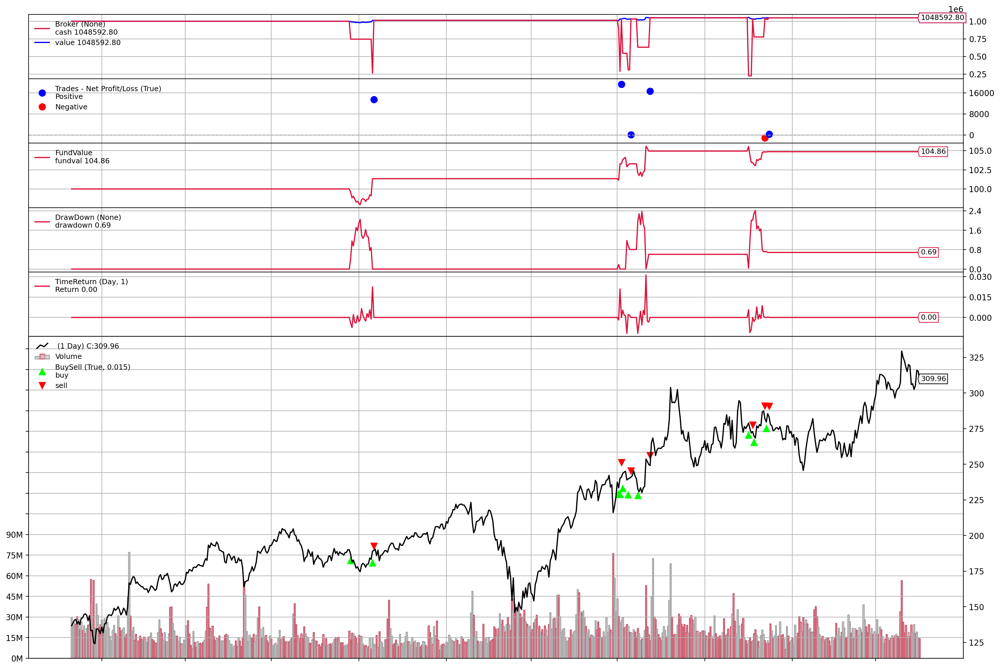

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 11, 28), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-11-28',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### TSLA

In [ ]:
tsla_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/TSLA.csv', index_col=0, parse_dates=True)
tsla_data.dropna(inplace=True)
time_data = tsla_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(tsla_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=tsla_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Today's price =  70.279999
Predicted price =  58.692553752114456
Probability  0.9983590665222563
Current mu =  2.459725560876576
Current sigma =  0.7782487691613891
down
Current f 4.0
2018-11-09T00:00:00, Order Canceled/Margin/Rejected
2018-11-09T00:00:00, 
Today's price =  70.101997
Predicted price =  57.7530214276042
Probability  0.9991307512250167
Current mu =  1.0476369378114372
Current sigma =  0.6348379091845672
down
Current f 4.0
2018-11-12T00:00:00, Order Canceled/Margin/Rejected
2018-11-12T00:00:00, 
Today's price =  66.255997
Predicted price =  63.223789795375325
Probability  0.7778144337738633
Current mu =  0.8323577626476135
Current sigma =  0.65083502834352
down
Current f 4.0
2018-11-13T00:00:00, Order Canceled/Margin/Rejected
2018-11-13T00:00:00, 
Today's price =  67.746002
Predicted price =  65.2859255597827
Probability  0.7322455828171035
Current mu =  1.2070471185885574
Current sigma =  0.648894033031989
down
Current f

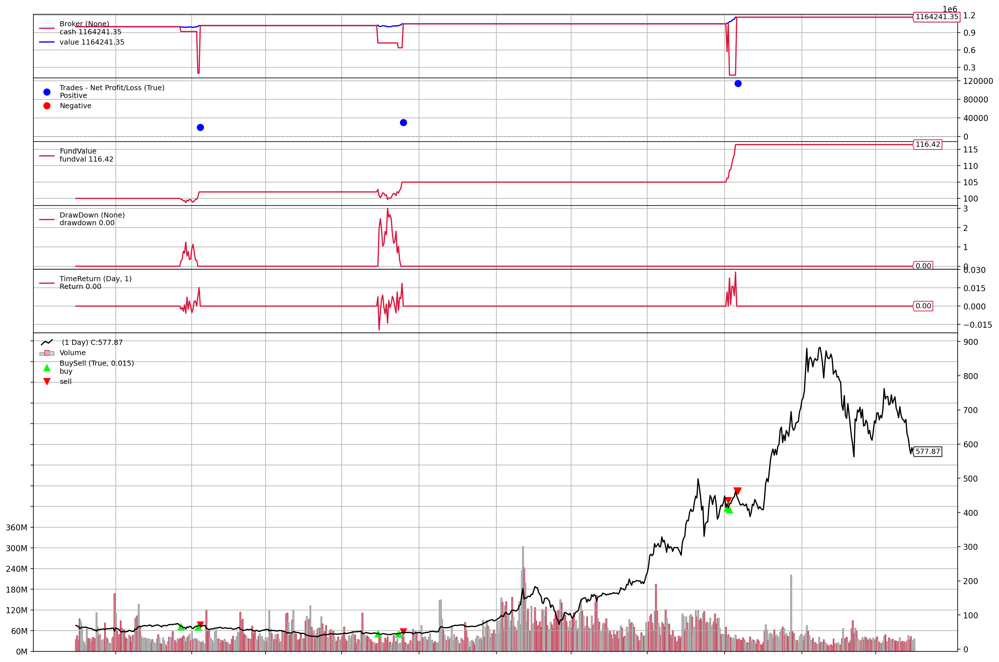

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### GOOGL

In [ ]:
googl_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/GOOGL.csv', index_col=0, parse_dates=True)
googl_data.dropna(inplace=True)
time_data = googl_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(googl_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=googl_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current f 0.1921562826852435
2018-12-13T00:00:00, BUY EXECUTED, Price: 1073.73, Cost: 191123.94, Comm 0.00
2018-12-13T00:00:00, 
Today's price =  1073.540039
Predicted price =  1071.4039550409382
Probability  0.5266828439005923
Current mu =  -0.13684459581701475
Current sigma =  0.3099870460277703
2018-12-14T00:00:00, 
Today's price =  1051.709961
Predicted price =  1055.0811553734582
Probability  0.5424896972048231
Current mu =  -0.2786373809598306
Current sigma =  0.31523095136056484
2018-12-17T00:00:00, 
Today's price =  1025.650024
Predicted price =  1091.4896235949798
Probability  0.9816326662146906
Current mu =  -0.3799431155015133
Current sigma =  0.3209492773851168
2018-12-18T00:00:00, 
Today's price =  1043.410034
Predicted price =  1094.3597756726253
Probability  0.9472021720671795
Current mu =  -0.10200111569572896
Current sigma =  0.32278961200119216
2018-12-19T00:00:00, 
Today's price =  1035.459961
Predicted price =  1098

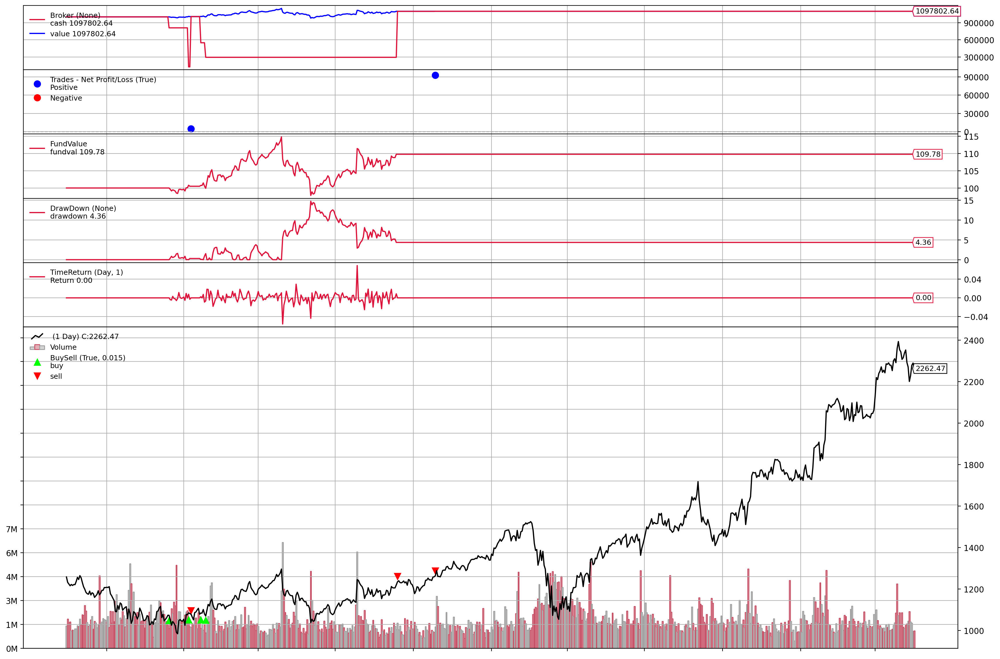

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### BRK-B

In [ ]:
brkb_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/BRK-B.csv', index_col=0, parse_dates=True)
brkb_data.dropna(inplace=True)
time_data = brkb_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(brkb_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=brkb_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2018-11-08T00:00:00, 
Today's price =  222.419998
Predicted price =  206.40177179241968
Probability  0.9998897268358256
Current mu =  0.3308809624632175
Current sigma =  0.28007677209592646
down
Current f 3.999999999999999
2018-11-09T00:00:00, Order Canceled/Margin/Rejected
2018-11-09T00:00:00, 
Today's price =  219.63000499999998
Predicted price =  202.7763678828776
Probability  0.9999467058342801
Current mu =  0.19404079352260062
Current sigma =  0.28289195380235926
down
Current f 5.545694112263355e-17
2018-11-12T00:00:00, 
Today's price =  215.419998
Predicted price =  204.2170496461249
Probability  0.9950892736637168
Current mu =  0.005245750869970352
Current sigma =  0.2887619722477443
down
Current f 0.0
2018-11-13T00:00:00, 
Today's price =  217.919998
Predicted price =  202.14998890341974
Probability  0.9998553356659892
Current mu =  0.06082319391270896
Current sigma =  0.2903377225825302
down
Current f 0.0
2018-11-14T00:00:00, 

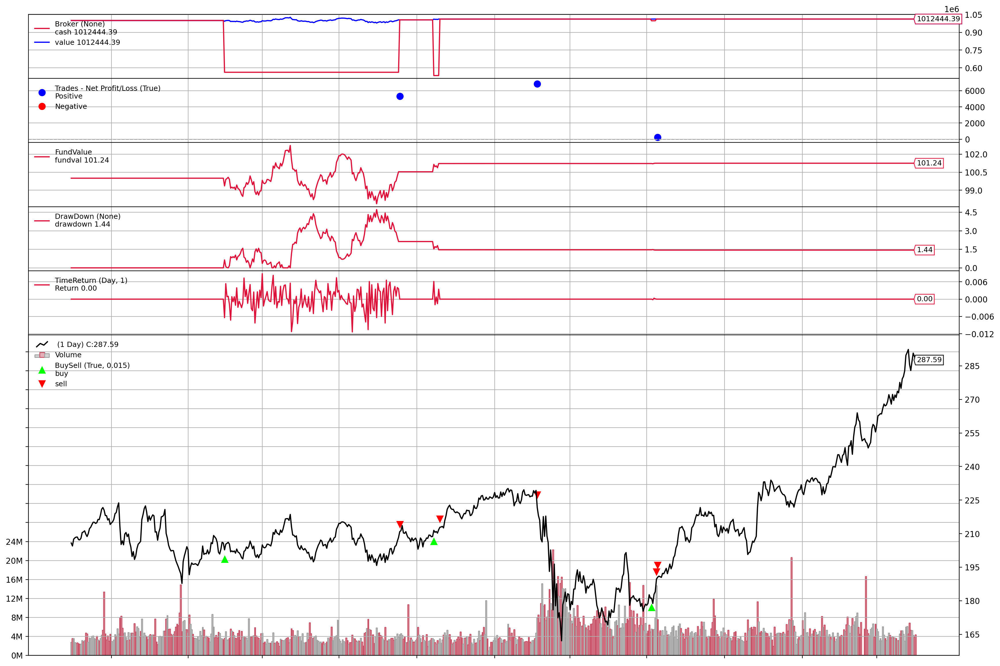

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: divide by zero encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### JPM

In [ ]:
jpm_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/JPM.csv', index_col=0, parse_dates=True)
jpm_data.dropna(inplace=True)
time_data = jpm_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(jpm_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=jpm_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2018-11-12T00:00:00, 
Today's price =  108.949997
Predicted price =  105.99589727977761
Probability  0.8408121407534839
Current mu =  -0.3914362123544459
Current sigma =  0.22490313020642758
2018-11-13T00:00:00, 
Today's price =  109.589996
Predicted price =  104.71487966335735
Probability  0.95000886664236
Current mu =  -0.4217420704074465
Current sigma =  0.22365805058099264
2018-11-14T00:00:00, 
Today's price =  107.33000200000001
Predicted price =  106.22664634534422
Probability  0.6452301719648259
Current mu =  -0.6201716303378687
Current sigma =  0.2300891849123556
2018-11-15T00:00:00, 
Today's price =  110.07
Predicted price =  107.37748830910019
Probability  0.8181123591591594
Current mu =  -0.3519815062743731
Current sigma =  0.2433509610587212
2018-11-16T00:00:00, 
Today's price =  109.989998
Predicted price =  109.44443260387459
Probability  0.572979999714037
Current mu =  -0.41120698182521315
Current sigma =  0.242327856944

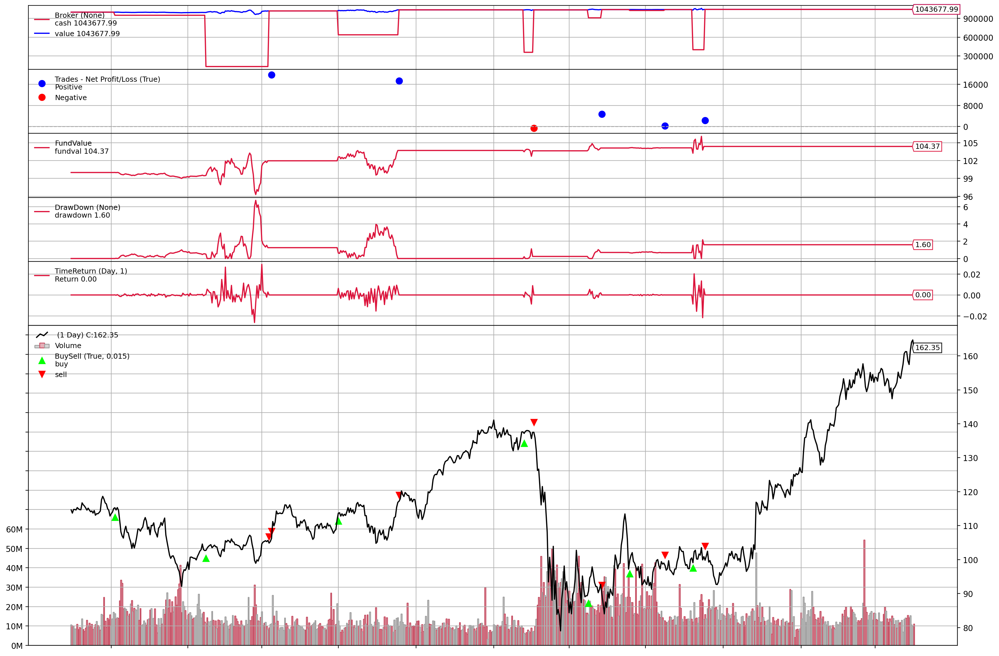

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### JNJ

In [ ]:
jnj_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/JNJ.csv', index_col=0, parse_dates=True)
jnj_data.dropna(inplace=True)
time_data = jnj_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(jnj_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=jnj_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2018-10-19T00:00:00, 
Today's price =  139.050003
Predicted price =  139.26545478361749
Probability  0.5274658413972548
Current mu =  0.11575448210013842
Current sigma =  0.15691046975081396
up
Current f 4.0
2018-10-22T00:00:00, Order Canceled/Margin/Rejected
2018-10-22T00:00:00, 
Today's price =  138.679993
Predicted price =  139.3246335872158
Probability  0.5816645717217945
Current mu =  0.010658568124094372
Current sigma =  0.15479860977983734
up
Current f 1.5070519595415184
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, 
Today's price =  138.929993
Predicted price =  139.06289137024433
Probability  0.5169566915282422
Current mu =  -0.02685417582933447
Current sigma =  0.15382825099180397
2018-10-24T00:00:00, 
Today's price =  137.470001
Predicted price =  139.43525720648844
Probability  0.7355236901412894
Current mu =  -0.1516403359558587
Current sigma =  0.1562669732513894
2018-10-25T00:00:00, 
Today's pr

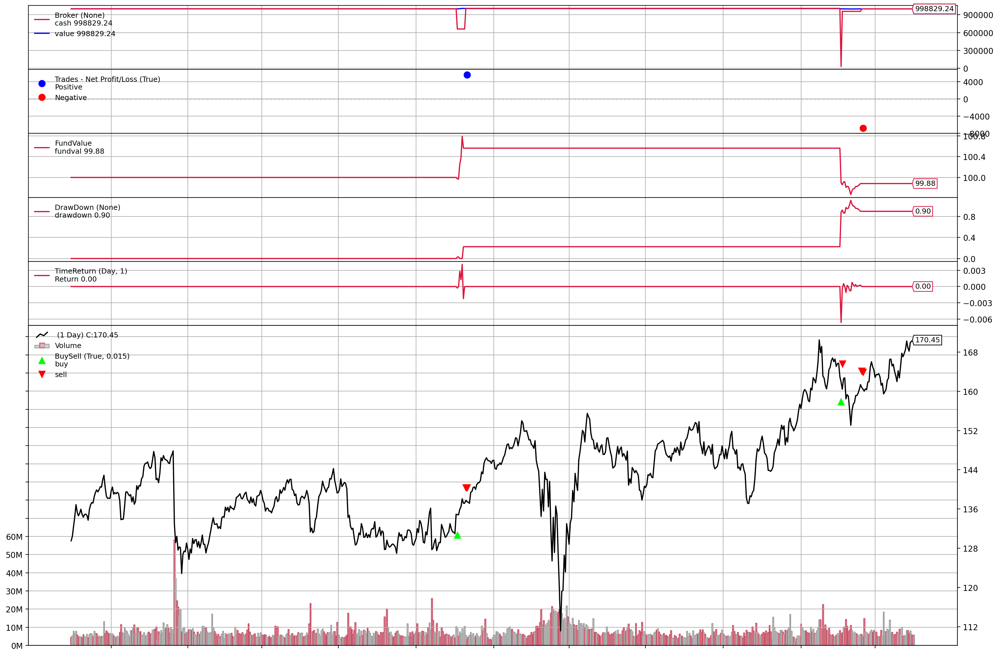

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### SPY

In [ ]:
spy_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/SPY.csv', index_col=0, parse_dates=True)
spy_data.dropna(inplace=True)
time_data = spy_data[train_len+59:].copy()
time_data['predicted_price'] = 0
train_len = int(0.7 * len(spy_data))
train_len

1761

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=spy_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Today's price =  265.369995
Predicted price =  269.87578366643265
Probability  0.8139539062335585
Current mu =  -0.17055649426455127
Current sigma =  0.200788352356809
2018-12-14T00:00:00, 
Today's price =  260.47000099999997
Predicted price =  269.470196923426
Probability  0.9636816117367174
Current mu =  -0.4244942222257397
Current sigma =  0.20435502394386382
2018-12-17T00:00:00, 
Today's price =  255.36000099999998
Predicted price =  274.25118046304965
Probability  0.9999141257358131
Current mu =  -0.5450439327973968
Current sigma =  0.21071736915297487
2018-12-18T00:00:00, 
Today's price =  255.080002
Predicted price =  273.75057598247724
Probability  0.9999008439498751
Current mu =  -0.6023857770440514
Current sigma =  0.20949497057911431
2018-12-19T00:00:00, 
Today's price =  251.25999500000003
Predicted price =  274.72513449200324
Probability  0.9999985094208311
Current mu =  -0.7883177684460789
Current sigma =  0.2109377237303

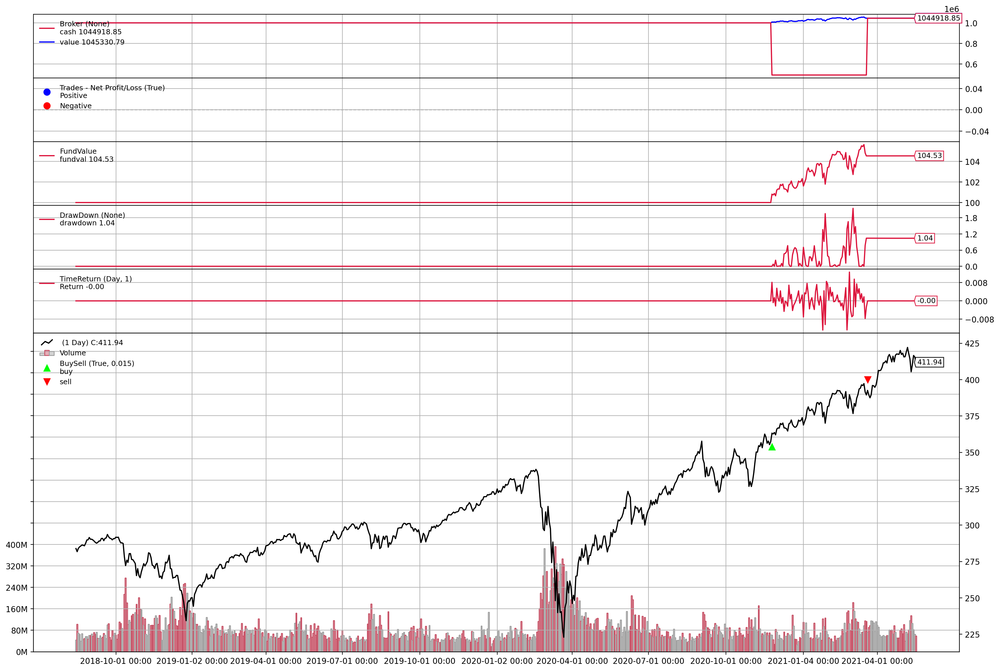

[[<Figure size 3600x2400 with 7 Axes>]]

In [ ]:
plt.rcParams['figure.figsize'] = [18, 12]
plt.rcParams['figure.dpi'] = 200 # 200 e.g. is really fine, but slower
cerebro.plot(start=dt.date(2018, 8, 14), iplot=False)

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-8-14',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


In [ ]:
strat[0].analyzers.TradeAnalyzer.get_analysis()     

AutoOrderedDict([('total', AutoOrderedDict([('total', 1), ('open', 1)]))])

In [ ]:
spy_lr_transaction = strat[0].analyzers.Transaction.get_analysis()
spy_lr_transaction

OrderedDict([(datetime.datetime(2020, 11, 24, 0, 0),
              [[1415, 357.459991, 0, '', -505805.887265]]),
             (datetime.datetime(2021, 3, 22, 0, 0),
              [[-1414, 389.480011, 0, '', 550724.735554]])])

In [ ]:
return_list = []
for key, value in spy_lr_transaction.items():
  return_list.append(value[0][4])

spy_lr_mean = (np.mean(return_list))
spy_lr_std = (np.std(return_list))

In [ ]:
spy_lr_mean/spy_lr_std

0.042515424843199534

##Stocks (HSI )

### 0700 (Tencent)

In [ ]:
tencent_data = pd.read_csv(r'/content/drive/My Drive/CFE/0700.HK.csv', index_col=0, parse_dates=True)
tencent_data.dropna(inplace=True)
train_len = int(0.7 * len(tencent_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = tencent_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  411.0
Predicted price =  384.58786640240635
Probability  0.9055341308563419
Current mu =  0.6085898808703771
Current sigma =  0.2461666872330849
down
Current f 4.0
2020-02-13T00:00:00, Order Canceled/Margin/Rejected
2020-02-13T00:00:00, 
Today's price =  416.399994
Predicted price =  385.65011026323145
Probability  0.936924607194114
Current mu =  0.8960907887519609
Current sigma =  0.23848449587040108
down
Current f 4.0
2020-02-14T00:00:00, Order Canceled/Margin/Rejected
2020-02-14T00:00:00, 
Today's price =  415.0
Predicted price =  383.20141724697015
Probability  0.9431137425728067
Current mu =  0.7109124619118908
Current sigma =  0.2352803356710441
down
Current f 4.0
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, 
Today's price =  416.600006
Predicted price =  374.8362445915812
Probability  0.9809557627270532
Current mu =  0.7307266075941209
Current sigma =  0.23526749491415042
down

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 1398 (ICBC)

In [ ]:
icbc_data = pd.read_csv(r'/content/drive/My Drive/CFE/1398.HK.csv', index_col=0, parse_dates=True)
icbc_data.dropna(inplace=True)
train_len = int(0.7 * len(icbc_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = icbc_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  5.56
Predicted price =  5.673354736819402
Probability  0.6710780918671523
Current mu =  -0.618258704268584
Current sigma =  0.22686346483103803
2020-02-13T00:00:00, 
Today's price =  5.49
Predicted price =  5.672189612172678
Probability  0.761716093370902
Current mu =  -0.7719126156574879
Current sigma =  0.22758727452232697
2020-02-14T00:00:00, 
Today's price =  5.52
Predicted price =  5.478343398929203
Probability  0.5642967289019349
Current mu =  -0.7966711642049679
Current sigma =  0.2264982701073837
2020-02-17T00:00:00, 
Today's price =  5.57
Predicted price =  5.373085957837263
Probability  0.7774757208246024
Current mu =  -0.64620112595839
Current sigma =  0.2286287525708903
2020-02-18T00:00:00, 
Today's price =  5.51
Predicted price =  5.309043916299648
Probability  0.7820304776932032
Current mu =  -0.6383385048583579
Current sigma =  0.22832818446032324
2020-02-19T00:00:00, 
Today's price =  5.56
Predi

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 4333 (CISCO-T)

In [ ]:
cisco_data = pd.read_csv(r'/content/drive/My Drive/CFE/4333.HK.csv', index_col=0, parse_dates=True)
cisco_data.dropna(inplace=True)
train_len = int(0.7 * len(cisco_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = cisco_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-13T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-14T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-17T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-18T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-19T00:00:00, 
Today's price =  400.0
Predicted price =  401.04008476248794
Probability  0.5157497533189571
Current mu =  0.0
Current sigma =  0.0
2020-02-20T00:00:00, 
Today's price =  

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/pyfolio/utils.py:266: RuntimeWarning: invalid value encountered in long_scalars
  return daily_pos.count(axis=1).sum() / txn_count < threshold
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/p

Skip


### 3968 (CM Bank)

In [ ]:
cm_data = pd.read_csv(r'/content/drive/My Drive/CFE/3968.HK.csv', index_col=0, parse_dates=True)
cm_data.dropna(inplace=True)
train_len = int(0.7 * len(cm_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = cm_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  38.849998
Predicted price =  40.06990989337364
Probability  0.7448123981393427
Current mu =  -0.32919298598781116
Current sigma =  0.2203544802104205
2020-02-13T00:00:00, 
Today's price =  38.400002
Predicted price =  40.07686454318229
Probability  0.8172511019157418
Current mu =  -0.3655836720992578
Current sigma =  0.22170094459530632
2020-02-14T00:00:00, 
Today's price =  38.700001
Predicted price =  39.39522797149891
Probability  0.6460113726049945
Current mu =  -0.5544998172448449
Current sigma =  0.20350458281825684
2020-02-17T00:00:00, 
Today's price =  39.5
Predicted price =  39.06792810170704
Probability  0.5919964315672391
Current mu =  -0.38722670928974184
Current sigma =  0.2136923670153696
2020-02-18T00:00:00, 
Today's price =  38.75
Predicted price =  38.765037488271325
Probability  0.5032299433702231
Current mu =  -0.4692357844685129
Current sigma =  0.21853136147214836
2020-02-19T00:00:00, 
Toda

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 939 (CCB)

In [ ]:
ccb_data = pd.read_csv(r'/content/drive/My Drive/CFE/0939.HK.csv', index_col=0, parse_dates=True)
ccb_data.dropna(inplace=True)
train_len = int(0.7 * len(ccb_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ccb_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  6.5
Predicted price =  6.493549862969252
Probability  0.5079577670687674
Current mu =  -0.3279504362647402
Current sigma =  0.2461723009072875
2020-02-13T00:00:00, 
Today's price =  6.44
Predicted price =  6.509048007173232
Probability  0.5845474046714303
Current mu =  -0.3827497962818723
Current sigma =  0.2472186346087095
2020-02-14T00:00:00, 
Today's price =  6.51
Predicted price =  6.320327467807325
Probability  0.7204801603743145
Current mu =  -0.3787225966316891
Current sigma =  0.24741550353598915
2020-02-17T00:00:00, 
Today's price =  6.54
Predicted price =  6.158745484922329
Probability  0.8792700508121416
Current mu =  -0.23593273257309083
Current sigma =  0.24602718759077447
2020-02-18T00:00:00, 
Today's price =  6.47
Predicted price =  6.094472531613923
Probability  0.875678885675933
Current mu =  -0.23845062176028747
Current sigma =  0.24612618287272292
2020-02-19T00:00:00, 
Today's price =  6.55
P

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 2318 (Ping An)

In [ ]:
pingan_data = pd.read_csv(r'/content/drive/My Drive/CFE/2318.HK.csv', index_col=0, parse_dates=True)
pingan_data.dropna(inplace=True)
train_len = int(0.7 * len(pingan_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = pingan_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  91.599998
Predicted price =  94.6354228332232
Probability  0.7709260455988141
Current mu =  -0.09435114801293847
Current sigma =  0.27873243237837075
2020-02-13T00:00:00, 
Today's price =  90.75
Predicted price =  95.55610526399575
Probability  0.8797927896306734
Current mu =  -0.12831534472396885
Current sigma =  0.27957519152386107
2020-02-14T00:00:00, 
Today's price =  90.900002
Predicted price =  92.28528838727259
Probability  0.631844152715328
Current mu =  -0.25899019376777604
Current sigma =  0.2748904006146019
2020-02-17T00:00:00, 
Today's price =  91.75
Predicted price =  91.4866683480009
Probability  0.525509193335872
Current mu =  -0.24742582984863354
Current sigma =  0.2752959347013879
2020-02-18T00:00:00, 
Today's price =  90.699997
Predicted price =  89.7353838041816
Probability  0.5925312965186145
Current mu =  -0.29666845705444256
Current sigma =  0.2766515215737602
2020-02-19T00:00:00, 
Today's

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 1288 (ABC)

In [ ]:
abc_data = pd.read_csv(r'/content/drive/My Drive/CFE/1288.HK.csv', index_col=0, parse_dates=True)
abc_data.dropna(inplace=True)
train_len = int(0.7 * len(abc_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = abc_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  3.12
Predicted price =  3.256127306982113
Probability  0.7812847178480073
Current mu =  -0.8484446320726493
Current sigma =  0.18545534498376276
2020-02-13T00:00:00, 
Today's price =  3.14
Predicted price =  3.2712412107777693
Probability  0.7729772122823422
Current mu =  -0.7676220771357598
Current sigma =  0.18759836195719132
2020-02-14T00:00:00, 
Today's price =  3.18
Predicted price =  3.1848719210293734
Probability  0.5110576414102648
Current mu =  -0.758375727103585
Current sigma =  0.18834379825830916
2020-02-17T00:00:00, 
Today's price =  3.17
Predicted price =  3.1256130077566096
Probability  0.5995807067552015
Current mu =  -0.7355153818906203
Current sigma =  0.18816153542957165
2020-02-18T00:00:00, 
Today's price =  3.16
Predicted price =  3.1085503313787544
Probability  0.6150070335106449
Current mu =  -0.6361123384093225
Current sigma =  0.18487989591175158
2020-02-19T00:00:00, 
Today's price =  3

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 1299 (AIA)

In [ ]:
aia_data = pd.read_csv(r'/content/drive/My Drive/CFE/1299.HK.csv', index_col=0, parse_dates=True)
aia_data.dropna(inplace=True)
train_len = int(0.7 * len(aia_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = aia_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  81.349998
Predicted price =  81.3817335264784
Probability  0.5039742656344086
Current mu =  -0.08503748471601788
Current sigma =  0.2566049525720288
2020-02-13T00:00:00, 
Today's price =  80.199997
Predicted price =  81.37286700419955
Probability  0.6437716426358302
Current mu =  -0.1716537348282198
Current sigma =  0.2595397330195969
2020-02-14T00:00:00, 
Today's price =  80.650002
Predicted price =  79.32063407573042
Probability  0.6614965121250134
Current mu =  -0.4257647479664258
Current sigma =  0.2376632433834751
2020-02-17T00:00:00, 
Today's price =  81.0
Predicted price =  77.5352516006282
Probability  0.8602558233293113
Current mu =  -0.4392815681308231
Current sigma =  0.2372747938222862
2020-02-18T00:00:00, 
Today's price =  79.800003
Predicted price =  77.04361033209189
Probability  0.8051921980452441
Current mu =  -0.47670021908286553
Current sigma =  0.23899619294100855
2020-02-19T00:00:00, 
Today

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


###0857 (Petrochina)

In [ ]:
petrochina_data = pd.read_csv(r'/content/drive/My Drive/CFE/0857.HK.csv', index_col=0, parse_dates=True)
petrochina_data.dropna(inplace=True)
train_len = int(0.7 * len(petrochina_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = petrochina_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  3.5
Predicted price =  3.8325574444699058
Probability  0.8849250277425211
Current mu =  -0.9403387354944354
Current sigma =  0.27594868235029507
2020-02-13T00:00:00, 
Today's price =  3.45
Predicted price =  3.810381676106701
Probability  0.9032238118932745
Current mu =  -1.0876245525658437
Current sigma =  0.2769557382690708
2020-02-14T00:00:00, 
Today's price =  3.45
Predicted price =  3.689589765393173
Probability  0.8058622020684354
Current mu =  -1.1319596241086605
Current sigma =  0.27584014104821064
2020-02-17T00:00:00, 
Today's price =  3.46
Predicted price =  3.6222440371254194
Probability  0.7203414475674232
Current mu =  -1.3466888941952857
Current sigma =  0.25966625559909695
2020-02-18T00:00:00, 
Today's price =  3.42
Predicted price =  3.573958960529282
Probability  0.7101492767832458
Current mu =  -1.785237293176959
Current sigma =  0.22370175094917774
2020-02-19T00:00:00, 
Today's price =  3.42


In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 3988 (Bank of China)

In [ ]:
boc_data = pd.read_csv(r'/content/drive/My Drive/CFE/3988.HK.csv', index_col=0, parse_dates=True)
boc_data.dropna(inplace=True)
train_len = int(0.7 * len(boc_data))
train_len

864

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = boc_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2020-02-12T00:00:00, 
Today's price =  3.19
Predicted price =  3.2605806128055246
Probability  0.6688924778879
Current mu =  -0.45116739341195494
Current sigma =  0.20378328415478797
2020-02-13T00:00:00, 
Today's price =  3.19
Predicted price =  3.257094921055826
Probability  0.6610557579698517
Current mu =  -0.37323274390658895
Current sigma =  0.20269093327240661
2020-02-14T00:00:00, 
Today's price =  3.22
Predicted price =  3.1755681334093464
Probability  0.6080510618161297
Current mu =  -0.3956520335035956
Current sigma =  0.20133966224920885
2020-02-17T00:00:00, 
Today's price =  3.23
Predicted price =  3.1190346623249363
Probability  0.7530165463015569
Current mu =  -0.34288368477993175
Current sigma =  0.20174021699477368
2020-02-18T00:00:00, 
Today's price =  3.2
Predicted price =  3.1036259104906314
Probability  0.7237708595314403
Current mu =  -0.24102283630493465
Current sigma =  0.19452537312332696
2020-02-19T00:00:00, 
Today's price =  

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2020-02-12',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: divide by zero encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


## SSE

### 601628 (China Life Insurance)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/601628.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current mu =  0.31932093941247314
Current sigma =  0.2058843455657237
down
Current f 4.0
2018-09-27T00:00:00, Order Canceled/Margin/Rejected
2018-09-27T00:00:00, 
Today's price =  22.49
Predicted price =  21.49286581221299
Probability  0.7059183525859978
Current mu =  0.2628080676795711
Current sigma =  0.20481743835082136
down
Current f 4.0
2018-09-28T00:00:00, Order Canceled/Margin/Rejected
2018-09-28T00:00:00, 
Today's price =  22.68
Predicted price =  21.30099228936732
Probability  0.773056409520029
Current mu =  0.4239697024378258
Current sigma =  0.2030606222059632
down
Current f 4.0
2018-10-08T00:00:00, Order Canceled/Margin/Rejected
2018-10-08T00:00:00, 
Today's price =  21.73
Predicted price =  21.254750636345523
Probability  0.6018467264091958
Current mu =  -0.10335484810963624
Current sigma =  0.23458978824629856
2018-10-09T00:00:00, 
Today's price =  21.73
Predicted price =  21.29909266197962
Probability  0.5925259500149607

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 601857 (Petrochina)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/601857.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2018-09-21T00:00:00, 
Today's price =  8.81
Predicted price =  8.265205040330493
Probability  0.8512660536386006
Current mu =  0.8489504621660681
Current sigma =  0.2170961051500212
down
Current f 4.0
2018-09-25T00:00:00, Order Canceled/Margin/Rejected
2018-09-25T00:00:00, 
Today's price =  8.89
Predicted price =  8.341841834393444
Probability  0.8527313908213997
Current mu =  0.7979639211179269
Current sigma =  0.21504179755770836
down
Current f 4.0
2018-09-26T00:00:00, Order Canceled/Margin/Rejected
2018-09-26T00:00:00, 
Today's price =  9.05
Predicted price =  8.226440441847698
Probability  0.9425860854972609
Current mu =  0.9851712781056989
Current sigma =  0.2180914223069672
down
Current f 4.0
2018-09-27T00:00:00, Order Canceled/Margin/Rejected
2018-09-27T00:00:00, 
Today's price =  9.11
Predicted price =  8.199062157775305
Probability  0.9594368720244414
Current mu =  1.1944750991459032
Current sigma =  0.2085143898150507
down
Current f 4.0
20

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/pyfolio/utils.py:266: RuntimeWarning: invalid value encountered in long_scalars
  return daily_pos.count(axis=1).sum() / txn_count < threshold
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/p

Skip


### 601318 (Ping An Insurance)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/601318.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2018-09-21T00:00:00, 
Today's price =  67.489998
Predicted price =  63.54332331537439
Probability  0.9415931330393424
Current mu =  1.0876244409784324
Current sigma =  0.3073020253849447
down
Current f 4.0
2018-09-25T00:00:00, Order Canceled/Margin/Rejected
2018-09-25T00:00:00, 
Today's price =  67.190002
Predicted price =  61.853722874466264
Probability  0.9828914053631365
Current mu =  1.1221814692908723
Current sigma =  0.30608197515345187
down
Current f 4.0
2018-09-26T00:00:00, Order Canceled/Margin/Rejected
2018-09-26T00:00:00, 
Today's price =  67.959999
Predicted price =  63.253631881329184
Probability  0.9691120785237289
Current mu =  1.523660252508793
Current sigma =  0.28296884935373234
down
Current f 4.0
2018-09-27T00:00:00, Order Canceled/Margin/Rejected
2018-09-27T00:00:00, 
Today's price =  67.199997
Predicted price =  62.79822800438584
Probability  0.9598420525908724
Current mu =  1.4335573862673754
Current sigma =  0.2867421473387219

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 601939 (China Construction Bank)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/601939.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2018-09-21T00:00:00, 
Today's price =  7.21
Predicted price =  6.681604373328439
Probability  0.9434440601855911
Current mu =  0.6764817594851715
Current sigma =  0.2304231186797241
down
Current f 4.0
2018-09-25T00:00:00, Order Canceled/Margin/Rejected
2018-09-25T00:00:00, 
Today's price =  7.1
Predicted price =  6.638941365866745
Probability  0.9165859647365592
Current mu =  0.529867335092285
Current sigma =  0.23628605340722356
down
Current f 3.999999999999999
2018-09-26T00:00:00, Order Canceled/Margin/Rejected
2018-09-26T00:00:00, 
Today's price =  7.13
Predicted price =  6.660943676007741
Probability  0.9202543765314715
Current mu =  0.7107912167682998
Current sigma =  0.22956292000566858
down
Current f 3.9999999999999996
2018-09-27T00:00:00, Order Canceled/Margin/Rejected
2018-09-27T00:00:00, 
Today's price =  7.13
Predicted price =  6.633582315774595
Probability  0.9318320847552413
Current mu =  0.67120274204289
Current sigma =  0.229642948263

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 600036 (China Merchants Bank)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/600036.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current mu =  -0.501749046376773
Current sigma =  0.42031776448453173
2018-11-12T00:00:00, 
Today's price =  28.559998999999998
Predicted price =  29.87582970209501
Probability  0.8917459111332671
Current mu =  -0.31667484538270246
Current sigma =  0.4157021463278532
2018-11-13T00:00:00, 
Today's price =  28.58
Predicted price =  30.000382543835713
Probability  0.9089903086342992
Current mu =  -0.5507403907833291
Current sigma =  0.40665716640800537
2018-11-14T00:00:00, 
Today's price =  28.16
Predicted price =  28.150567692581234
Probability  0.5035146641662974
Current mu =  -0.6736779662068144
Current sigma =  0.4082567157668517
2018-11-15T00:00:00, 
Today's price =  28.379998999999998
Predicted price =  28.667266501172968
Probability  0.6057699196593365
Current mu =  -0.6799851968749291
Current sigma =  0.408089353565011
2018-11-16T00:00:00, 
Today's price =  28.48
Predicted price =  29.08245982723672
Probability  0.7131470836392226

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 601398 (Industrial and Commercial Bank of China)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/601398.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1700

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 1000000.00
2018-09-21T00:00:00, 
Today's price =  5.75
Predicted price =  5.323086295088943
Probability  0.9712835404407049
Current mu =  0.5457181762839828
Current sigma =  0.19721676557545323
down
Current f 4.0
2018-09-25T00:00:00, Order Canceled/Margin/Rejected
2018-09-25T00:00:00, 
Today's price =  5.67
Predicted price =  5.290566780159934
Probability  0.9543692677660263
Current mu =  0.45621335788357653
Current sigma =  0.2020803298817338
down
Current f 4.0
2018-09-26T00:00:00, Order Canceled/Margin/Rejected
2018-09-26T00:00:00, 
Today's price =  5.7
Predicted price =  5.3254030853790795
Probability  0.9523400258190708
Current mu =  0.64866476208671
Current sigma =  0.1943233538176059
down
Current f 4.0
2018-09-27T00:00:00, Order Canceled/Margin/Rejected
2018-09-27T00:00:00, 
Today's price =  5.69
Predicted price =  5.334486019532595
Probability  0.9434454507747065
Current mu =  0.6663217643935165
Current sigma =  0.19383379734794803
down
Current f 4.0
20

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-09-05',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


### 600519 (Kweichow Moutai)

In [ ]:
ss_raw_data = pd.read_csv(r'/content/drive/My Drive/lstm_stock_predictions/600519.SS.csv', index_col=0, parse_dates=True)
ss_raw_data.dropna(inplace=True)
train_len = int(0.7 * len(ss_raw_data))
train_len

1701

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname = ss_raw_data)

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)


# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")

# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Predicted price =  697.0499933265203
Probability  0.7305501245262831
Current mu =  -0.6714866114092528
Current sigma =  0.2949975734693137
2018-08-30T00:00:00, 
Today's price =  680.400024
Predicted price =  706.2836852752264
Probability  0.9227349685437238
Current mu =  -0.7429234545867118
Current sigma =  0.29525444064396683
2018-08-31T00:00:00, 
Today's price =  659.1900019999999
Predicted price =  689.8674383709899
Probability  0.9535321873778477
Current mu =  -0.9112349175962347
Current sigma =  0.3057300334826168
2018-09-03T00:00:00, 
Today's price =  666.210022
Predicted price =  679.9740588452448
Probability  0.7739707242206235
Current mu =  -0.9759877453988244
Current sigma =  0.3018799884526838
2018-09-04T00:00:00, 
Today's price =  675.039978
Predicted price =  664.661305044845
Probability  0.7147298264324802
Current mu =  -0.8430156643094375
Current sigma =  0.30587292085750406
2018-09-05T00:00:00, 
Today's price =  657.789

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2018-03-30',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:713: RuntimeWarning: invalid value encountered in true_divide
  out=out,
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:799: RuntimeWarning: invalid value encountered in true_divide
  np.divide(average_annual_return, annualized_downside_risk, out=out)
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))
/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


# Phase 2


## 2 week data


### Parse the raw_data


In [ ]:
raw_data = pd.read_csv('/content/drive/My Drive/lstm_stock_predictions/crypto_2_weeks.csv', index_col=0, parse_dates=True)
crypto_data = {}
for name in raw_data.index.unique() :
  print(name)
  crypto_data[name] = pd.DataFrame()
  crypto_data[name]['Time'] = pd.to_datetime(raw_data.loc[name]['TIME'], format='%d-%m-%y %H:%M:%S')
  crypto_data[name]['Close'] = (raw_data.loc[name]['ASK'] + raw_data.loc[name]['BID'])/2
  crypto_data[name] = crypto_data[name].set_index('Time')
  crypto_data[name] = crypto_data[name].sort_index()



YFI/USD
UNI/USD
LINK/USD
ADA/USD
DOT/USD
DOG/USD
UST/USD
LTC/USD
ETH/USD
BTC/USD


###YFI-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['YFI/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['YFI/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Today's price =  35643.0
Predicted price =  35646.0359302554
Probability  0.5086029667370121
Current mu =  0.046690431984943846
Current sigma =  0.008206539863031418
up
Current f 0.9999999999999996
2021-06-13T05:23:11, 
Today's price =  35677.0
Predicted price =  35653.21508473945
Probability  0.5670858361361875
Current mu =  0.056323789737688444
Current sigma =  0.00843205779345555
down
Current f 1.0
2021-06-13T05:23:21, 
Today's price =  35691.0
Predicted price =  35668.536439833486
Probability  0.5633913381647624
Current mu =  0.061326636801926945
Current sigma =  0.008355192107531322
down
Current f 0.9999999999999998
2021-06-13T05:23:31, 
Today's price =  35699.0
Predicted price =  35673.85756251483
Probability  0.5708751641625728
Current mu =  0.06094514579256077
Current sigma =  0.008355033707362215
down
Current f 1.0
2021-06-13T05:23:41, 
Today's price =  35721.0
Predicted price =  35683.967644766446
Probability  0.6037496894996

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      round_trips=True)
except :
  print('Skip')

Start date,2021-05-30
End date,2021-06-13
Total months,0
,Backtest
Annual return,-20.9%
Cumulative returns,-1.4%
Annual volatility,8.3%
Sharpe ratio,-2.77
Calmar ratio,-15.08
Stability,0.35
Max drawdown,-1.4%


Skip


### UNI-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['UNI/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['UNI/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Probability  0.9425175175243072
Current mu =  0.07804536828063048
Current sigma =  0.015439693857431283
down
Current f 1.0
2021-06-13T05:21:21, 
Today's price =  20.8655
Predicted price =  20.722047826670448
Probability  0.9328444260047429
Current mu =  0.08684809601117775
Current sigma =  0.015153026433602453
down
Current f 0.9999999999999996
2021-06-13T05:21:31, 
Today's price =  20.889499999999998
Predicted price =  20.73463356108057
Probability  0.9470025014354552
Current mu =  0.09978240662326164
Current sigma =  0.015182896436134019
down
Current f 0.9999999999999998
2021-06-13T05:21:40, 
Today's price =  20.887999999999998
Predicted price =  20.74927694873334
Probability  0.9261884164912557
Current mu =  0.11136978634038545
Current sigma =  0.014272198678121057
down
Current f 1.0
2021-06-13T05:21:51, 
Today's price =  20.868499999999997
Predicted price =  20.749672039656083
Probability  0.8925752653264495
Current mu =  0.10936589

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###LINK-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['LINK/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['LINK/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:23:41, 
Today's price =  20.945
Predicted price =  20.979496301060045
Probability  0.620987302982636
Current mu =  0.07876818652287032
Current sigma =  0.01594761515425053
up
Current f 1.0
2021-06-13T05:23:51, 
Today's price =  20.9125
Predicted price =  20.939275451890552
Probability  0.5944932909265359
Current mu =  0.06883344218151778
Current sigma =  0.01672250795482796
up
Current f 0.9999999999999997
2021-06-13T05:24:01, 
Today's price =  20.895
Predicted price =  20.906591958490484
Probability  0.5412253474100345
Current mu =  0.056952821588830804
Current sigma =  0.01700650934101106
up
Current f 1.0
2021-06-13T05:24:11, 
Today's price =  20.897
Predicted price =  20.888484277090207
Probability  0.5303099273151402
Current mu =  0.049207315979823515
Current sigma =  0.016855197863529264
down
Current f 1.0
2021-06-13T05:24:21, 
Today's price =  20.898
Predicted price =  20.87517043081448
Probability  0.580775272738204

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###ADA-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['ADA/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['ADA/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current sigma =  0.010218602600678596
down
Current f 1.0
2021-06-13T05:21:31, 
Today's price =  1.4482
Predicted price =  1.43978073458461
Probability  0.9439915917460664
Current mu =  0.0611176187733988
Current sigma =  0.010145827098991665
down
Current f 1.0
2021-06-13T05:21:40, 
Today's price =  1.4478499999999999
Predicted price =  1.439221543355645
Probability  0.948309692815972
Current mu =  0.06808598377619222
Current sigma =  0.00950833187635859
down
Current f 0.9999999999999998
2021-06-13T05:21:51, 
Today's price =  1.44665
Predicted price =  1.4392714428346451
Probability  0.9181586873326761
Current mu =  0.05785691842452428
Current sigma =  0.010022097603058965
down
Current f 0.9999999999999999
2021-06-13T05:22:01, 
Today's price =  1.4456
Predicted price =  1.4397780431172393
Probability  0.8641092755897736
Current mu =  0.043690169881903225
Current sigma =  0.010179755473121681
down
Current f 1.0
2021-06-13T05:22:11, 
Toda

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###DOT-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['DOT/USD']))
train_len

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['DOT/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current sigma =  0.011886330805530336
up
Current f 0.9999999999999999
2021-06-13T05:22:51, 
Today's price =  20.3855
Predicted price =  20.456442671550917
Probability  0.7695775427212098
Current mu =  0.05473412590019438
Current sigma =  0.011938161222827579
up
Current f 1.0
2021-06-13T05:23:01, 
Today's price =  20.380000000000003
Predicted price =  20.429528424545104
Probability  0.6966724531115223
Current mu =  0.04360011250262519
Current sigma =  0.01177315220197894
up
Current f 0.9999999999999998
2021-06-13T05:23:11, 
Today's price =  20.402
Predicted price =  20.441331391083413
Probability  0.6586768364619935
Current mu =  0.05383254109850269
Current sigma =  0.012028360281928743
up
Current f 1.0
2021-06-13T05:23:21, 
Today's price =  20.4115
Predicted price =  20.446920547806073
Probability  0.6436384632399752
Current mu =  0.061735828701925774
Current sigma =  0.011883911605138076
up
Current f 1.0
2021-06-13T05:23:31, 
Today's 

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###DOG-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['DOG/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['DOG/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current f 0.9999999999999996
2021-06-13T05:21:21, 
Today's price =  309080.0
Predicted price =  308309.8845048867
Probability  0.6616983013891915
Current mu =  0.018434591695841874
Current sigma =  0.006126581719892969
down
Current f 1.0
2021-06-13T05:21:31, 
Today's price =  309085.0
Predicted price =  308369.7518321277
Probability  0.6507647217209667
Current mu =  0.01913866752779441
Current sigma =  0.006115207092141595
down
Current f 1.0
2021-06-13T05:21:41, 
Today's price =  309070.0
Predicted price =  308457.0280497112
Probability  0.6300523434081158
Current mu =  0.021535013919123644
Current sigma =  0.006009620781956231
down
Current f 1.0
2021-06-13T05:21:51, 
Today's price =  309000.0
Predicted price =  308450.0784713167
Probability  0.6170886270868561
Current mu =  0.018721190033918644
Current sigma =  0.006076891949189582
down
Current f 1.0
2021-06-13T05:22:01, 
Today's price =  308965.0
Predicted price =  308446.22780970903

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###UST-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['UST/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['UST/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:04:40, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:04:50, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:00, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:10, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:20, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:30, 
Today's price =  1.0002499999999999
Predicted price =

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###LTC-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['LTC/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['LTC/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:23:00, 
Today's price =  158.42000000000002
Predicted price =  158.3088417733507
Probability  0.5762268282611137
Current mu =  0.07187833145603295
Current sigma =  0.015347212895903505
down
Current f 0.9999999999999998
2021-06-13T05:23:10, 
Today's price =  158.565
Predicted price =  158.4245799619152
Probability  0.5959425998090819
Current mu =  0.08480734614377151
Current sigma =  0.015228861425401212
down
Current f 1.0
2021-06-13T05:23:20, 
Today's price =  158.685
Predicted price =  158.66584249345956
Probability  0.5132155600728346
Current mu =  0.09331817261256788
Current sigma =  0.015180368534542842
down
Current f 1.0
2021-06-13T05:23:30, 
Today's price =  158.655
Predicted price =  158.85658437211987
Probability  0.6363167022896401
Current mu =  0.09029152407268398
Current sigma =  0.01525579056246362
up
Current f 1.0
2021-06-13T05:23:40, 
Today's price =  158.685
Predicted price =  158.64818836614864
Probability

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


### ETH-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['ETH/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['ETH/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:22:50, 
Today's price =  2328.95
Predicted price =  2330.0126126075756
Probability  0.548634262527269
Current mu =  0.02896460971736946
Current sigma =  0.00784919794302104
up
Current f 1.0
2021-06-13T05:23:00, 
Today's price =  2329.1499999999996
Predicted price =  2327.990775163373
Probability  0.5530309639076136
Current mu =  0.026529325612852633
Current sigma =  0.007813159177911025
down
Current f 1.0
2021-06-13T05:23:10, 
Today's price =  2331.3999999999996
Predicted price =  2330.682728164531
Probability  0.5328725661008783
Current mu =  0.0410965153532167
Current sigma =  0.0078004363423142585
down
Current f 1.0
2021-06-13T05:23:20, 
Today's price =  2333.05
Predicted price =  2330.4137855770646
Probability  0.6191269953644852
Current mu =  0.049304199960151444
Current sigma =  0.007858977118753078
down
Current f 1.0
2021-06-13T05:23:30, 
Today's price =  2332.8500000000004
Predicted price =  2330.679191447531
Prob

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###BTC-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['BTC/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['BTC/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Predicted price =  35004.74648656505
Probability  0.5598414845200879
Current mu =  -0.011044254085323613
Current sigma =  0.005148164894377747
2021-06-13T05:26:30, 
Today's price =  34990.5
Predicted price =  35001.43161541401
Probability  0.5459890338431286
Current mu =  -0.012532293675536169
Current sigma =  0.0051097522767810455
2021-06-13T05:26:40, 
Today's price =  34964.5
Predicted price =  35000.8931936265
Probability  0.6497450363380506
Current mu =  -0.01502294683842525
Current sigma =  0.005368996783224414
2021-06-13T05:26:50, 
Today's price =  34954.5
Predicted price =  35001.882366524354
Probability  0.6917357936458612
Current mu =  -0.018252845783117755
Current sigma =  0.00538951639596694
2021-06-13T05:27:00, 
Today's price =  34952.5
Predicted price =  34998.64538078894
Probability  0.6871207835763951
Current mu =  -0.01329064066130976
Current sigma =  0.005125085454502515
2021-06-13T05:27:10, 
Today's price =  34952.5
P

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


## 1 month data


### Parse the raw_data


In [ ]:
raw_data = pd.read_csv('/content/drive/My Drive/lstm_stock_predictions/crypto_1_month.csv', index_col=0, parse_dates=True)
crypto_data = {}
for name in raw_data.index.unique() :
  print(name)
  crypto_data[name] = pd.DataFrame()
  crypto_data[name]['Time'] = pd.to_datetime(raw_data.loc[name]['TIME'], format='%d-%m-%y %H:%M:%S')
  crypto_data[name]['Close'] = (raw_data.loc[name]['ASK'] + raw_data.loc[name]['BID'])/2
  crypto_data[name] = crypto_data[name].set_index('Time')
  crypto_data[name] = crypto_data[name].sort_index()



UST/USD
BTC/USD
ETH/USD
LTC/BTC
YFI/USD
UNI/USD
LINK/USD
ADA/USD
DOT/USD
DOG/USD


###YFI-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['YFI/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['YFI/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data)

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Today's price =  35643.0
Predicted price =  35646.0359302554
Probability  0.5086029667370121
Current mu =  0.046690431984943846
Current sigma =  0.008206539863031418
up
Current f 0.9999999999999996
2021-06-13T05:23:11, 
Today's price =  35677.0
Predicted price =  35653.21508473945
Probability  0.5670858361361875
Current mu =  0.056323789737688444
Current sigma =  0.00843205779345555
down
Current f 1.0
2021-06-13T05:23:21, 
Today's price =  35691.0
Predicted price =  35668.536439833486
Probability  0.5633913381647624
Current mu =  0.061326636801926945
Current sigma =  0.008355192107531322
down
Current f 0.9999999999999998
2021-06-13T05:23:31, 
Today's price =  35699.0
Predicted price =  35673.85756251483
Probability  0.5708751641625728
Current mu =  0.06094514579256077
Current sigma =  0.008355033707362215
down
Current f 1.0
2021-06-13T05:23:41, 
Today's price =  35721.0
Predicted price =  35683.967644766446
Probability  0.6037496894996

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      round_trips=True)
except :
  print('Skip')

Start date,2021-05-30
End date,2021-06-13
Total months,0
,Backtest
Annual return,-20.9%
Cumulative returns,-1.4%
Annual volatility,8.3%
Sharpe ratio,-2.77
Calmar ratio,-15.08
Stability,0.35
Max drawdown,-1.4%


Skip


### UNI-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['UNI/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['UNI/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Probability  0.9425175175243072
Current mu =  0.07804536828063048
Current sigma =  0.015439693857431283
down
Current f 1.0
2021-06-13T05:21:21, 
Today's price =  20.8655
Predicted price =  20.722047826670448
Probability  0.9328444260047429
Current mu =  0.08684809601117775
Current sigma =  0.015153026433602453
down
Current f 0.9999999999999996
2021-06-13T05:21:31, 
Today's price =  20.889499999999998
Predicted price =  20.73463356108057
Probability  0.9470025014354552
Current mu =  0.09978240662326164
Current sigma =  0.015182896436134019
down
Current f 0.9999999999999998
2021-06-13T05:21:40, 
Today's price =  20.887999999999998
Predicted price =  20.74927694873334
Probability  0.9261884164912557
Current mu =  0.11136978634038545
Current sigma =  0.014272198678121057
down
Current f 1.0
2021-06-13T05:21:51, 
Today's price =  20.868499999999997
Predicted price =  20.749672039656083
Probability  0.8925752653264495
Current mu =  0.10936589

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###LINK-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['LINK/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['LINK/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:23:41, 
Today's price =  20.945
Predicted price =  20.979496301060045
Probability  0.620987302982636
Current mu =  0.07876818652287032
Current sigma =  0.01594761515425053
up
Current f 1.0
2021-06-13T05:23:51, 
Today's price =  20.9125
Predicted price =  20.939275451890552
Probability  0.5944932909265359
Current mu =  0.06883344218151778
Current sigma =  0.01672250795482796
up
Current f 0.9999999999999997
2021-06-13T05:24:01, 
Today's price =  20.895
Predicted price =  20.906591958490484
Probability  0.5412253474100345
Current mu =  0.056952821588830804
Current sigma =  0.01700650934101106
up
Current f 1.0
2021-06-13T05:24:11, 
Today's price =  20.897
Predicted price =  20.888484277090207
Probability  0.5303099273151402
Current mu =  0.049207315979823515
Current sigma =  0.016855197863529264
down
Current f 1.0
2021-06-13T05:24:21, 
Today's price =  20.898
Predicted price =  20.87517043081448
Probability  0.580775272738204

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###ADA-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['ADA/USD']))
train_len

46200

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['ADA/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current sigma =  0.0033983284079223885
up
Current f 1.0
2021-06-13T10:13:21, 
Today's price =  1.4464000000000001
Predicted price =  1.4486720691901838
Probability  0.5619736578655217
Current mu =  0.008114292369002265
Current sigma =  0.0034661376380257193
up
Current f 1.0
2021-06-13T10:13:31, 
Today's price =  1.4463
Predicted price =  1.4486761049243215
Probability  0.5647868409482208
Current mu =  0.006310897845152498
Current sigma =  0.0034630114843225927
up
Current f 1.0
2021-06-13T10:13:41, 
Today's price =  1.44625
Predicted price =  1.448521289220642
Probability  0.5619525551523188
Current mu =  0.005409247411617241
Current sigma =  0.0034645590530532322
up
Current f 1.0
2021-06-13T10:13:51, 
Today's price =  1.4461
Predicted price =  1.4482625883886175
Probability  0.559009850633981
Current mu =  0.003606164876383654
Current sigma =  0.0034738420333995683
up
Current f 1.0
2021-06-13T10:14:01, 
Today's price =  1.4459499999999

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

/usr/local/lib/python3.7/dist-packages/empyrical/stats.py:1528: RuntimeWarning: invalid value encountered in double_scalars
  np.abs(np.percentile(returns, 5))


Skip


###DOT-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['DOT/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['DOT/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current sigma =  0.011886330805530336
up
Current f 0.9999999999999999
2021-06-13T05:22:51, 
Today's price =  20.3855
Predicted price =  20.456442671550917
Probability  0.7695775427212098
Current mu =  0.05473412590019438
Current sigma =  0.011938161222827579
up
Current f 1.0
2021-06-13T05:23:01, 
Today's price =  20.380000000000003
Predicted price =  20.429528424545104
Probability  0.6966724531115223
Current mu =  0.04360011250262519
Current sigma =  0.01177315220197894
up
Current f 0.9999999999999998
2021-06-13T05:23:11, 
Today's price =  20.402
Predicted price =  20.441331391083413
Probability  0.6586768364619935
Current mu =  0.05383254109850269
Current sigma =  0.012028360281928743
up
Current f 1.0
2021-06-13T05:23:21, 
Today's price =  20.4115
Predicted price =  20.446920547806073
Probability  0.6436384632399752
Current mu =  0.061735828701925774
Current sigma =  0.011883911605138076
up
Current f 1.0
2021-06-13T05:23:31, 
Today's 

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###DOG-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['DOG/USD']))
train_len

46200

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['DOG/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Predicted price =  310631.9935318345
Probability  0.5745498673138503
Current mu =  -0.01372331169451071
Current sigma =  0.026897152987789063
2021-06-13T10:13:41, 
Today's price =  309980.0
Predicted price =  310466.20880354935
Probability  0.5598410764285744
Current mu =  -0.022117861594562162
Current sigma =  0.02676920897981637
2021-06-13T10:13:51, 
Today's price =  309960.0
Predicted price =  310599.9910020113
Probability  0.5785512714932853
Current mu =  -0.029386755002068842
Current sigma =  0.026645121393278952
2021-06-13T10:14:01, 
Today's price =  309960.0
Predicted price =  310498.8778557656
Probability  0.566266425978541
Current mu =  0.004206232316221906
Current sigma =  0.02415478052285046
up
Current f 1.0
2021-06-13T10:14:11, 
Today's price =  309880.0
Predicted price =  310534.29938230553
Probability  0.580284199424054
Current mu =  -0.010649431995372646
Current sigma =  0.023777006851879702
2021-06-13T10:14:21, 
Today's

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###UST-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['UST/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['UST/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:04:40, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:04:50, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:00, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:10, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:20, 
Today's price =  1.0002499999999999
Predicted price =  1.0002501083619753
Probability  0.5009902302042379
Current mu =  0.0
Current sigma =  0.0
2021-06-13T05:05:30, 
Today's price =  1.0002499999999999
Predicted price =

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###LTC-BTC

In [ ]:
train_len = int(0.7 * len(crypto_data['LTC/BTC']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['LTC/BTC'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:23:00, 
Today's price =  158.42000000000002
Predicted price =  158.3088417733507
Probability  0.5762268282611137
Current mu =  0.07187833145603295
Current sigma =  0.015347212895903505
down
Current f 0.9999999999999998
2021-06-13T05:23:10, 
Today's price =  158.565
Predicted price =  158.4245799619152
Probability  0.5959425998090819
Current mu =  0.08480734614377151
Current sigma =  0.015228861425401212
down
Current f 1.0
2021-06-13T05:23:20, 
Today's price =  158.685
Predicted price =  158.66584249345956
Probability  0.5132155600728346
Current mu =  0.09331817261256788
Current sigma =  0.015180368534542842
down
Current f 1.0
2021-06-13T05:23:30, 
Today's price =  158.655
Predicted price =  158.85658437211987
Probability  0.6363167022896401
Current mu =  0.09029152407268398
Current sigma =  0.01525579056246362
up
Current f 1.0
2021-06-13T05:23:40, 
Today's price =  158.685
Predicted price =  158.64818836614864
Probability

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


### ETH-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['ETH/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['ETH/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
2021-06-13T05:22:50, 
Today's price =  2328.95
Predicted price =  2330.0126126075756
Probability  0.548634262527269
Current mu =  0.02896460971736946
Current sigma =  0.00784919794302104
up
Current f 1.0
2021-06-13T05:23:00, 
Today's price =  2329.1499999999996
Predicted price =  2327.990775163373
Probability  0.5530309639076136
Current mu =  0.026529325612852633
Current sigma =  0.007813159177911025
down
Current f 1.0
2021-06-13T05:23:10, 
Today's price =  2331.3999999999996
Predicted price =  2330.682728164531
Probability  0.5328725661008783
Current mu =  0.0410965153532167
Current sigma =  0.0078004363423142585
down
Current f 1.0
2021-06-13T05:23:20, 
Today's price =  2333.05
Predicted price =  2330.4137855770646
Probability  0.6191269953644852
Current mu =  0.049304199960151444
Current sigma =  0.007858977118753078
down
Current f 1.0
2021-06-13T05:23:30, 
Today's price =  2332.8500000000004
Predicted price =  2330.679191447531
Prob

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip


###BTC-USD

In [ ]:
train_len = int(0.7 * len(crypto_data['BTC/USD']))
train_len

44409

In [ ]:
cerebro = bt.Cerebro()

# Add a strategy
cerebro.addstrategy(Test_Strategy)


# Create a Data Feed
data = bt.feeds.PandasData(dataname=crypto_data['BTC/USD'])

# Add the Data Feed to Cerebro
cerebro.adddata(data) 

# Set our desired cash start
cerebro.broker.setcash(1000000.0)
cerebro.broker.set_coc(True)

# Add observers
cerebro.addobserver(bt.observers.FundValue)
cerebro.addobserver(bt.observers.FundShares)
cerebro.addobserver(bt.observers.DrawDown)
cerebro.addobserver(bt.observers.Trades)
cerebro.addobserver(bt.observers.TimeReturn)

# Add analyzers
cerebro.addanalyzer(bt.analyzers.SharpeRatio_A, _name="Sharpe_annual")
cerebro.addanalyzer(bt.analyzers.SharpeRatio, _name="Sharpe")
cerebro.addanalyzer(bt.analyzers.Transactions, _name="Transaction")
cerebro.addanalyzer(bt.analyzers.TimeReturn)  # auto-detect broker mode
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=True, _name="NAV")  # track fund value
cerebro.addanalyzer(bt.analyzers.TimeReturn, fund=False, _name="TimeReturn")
cerebro.addanalyzer(bt.analyzers.Calmar, fund=False, _name="Calmar")
cerebro.addanalyzer(bt.analyzers.DrawDown, fund=True, _name="DrawDown")
cerebro.addanalyzer(bt.analyzers.TradeAnalyzer, _name="TradeAnalyzer")
cerebro.addanalyzer(bt.analyzers.PyFolio, _name="pyfolio")
# Set the commission
cerebro.broker.setcommission(commission=0.0)

# Print out the starting conditions
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())

# Run over everything
strat = cerebro.run()

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Streaming output truncated to the last 5000 lines.
Predicted price =  35004.74648656505
Probability  0.5598414845200879
Current mu =  -0.011044254085323613
Current sigma =  0.005148164894377747
2021-06-13T05:26:30, 
Today's price =  34990.5
Predicted price =  35001.43161541401
Probability  0.5459890338431286
Current mu =  -0.012532293675536169
Current sigma =  0.0051097522767810455
2021-06-13T05:26:40, 
Today's price =  34964.5
Predicted price =  35000.8931936265
Probability  0.6497450363380506
Current mu =  -0.01502294683842525
Current sigma =  0.005368996783224414
2021-06-13T05:26:50, 
Today's price =  34954.5
Predicted price =  35001.882366524354
Probability  0.6917357936458612
Current mu =  -0.018252845783117755
Current sigma =  0.00538951639596694
2021-06-13T05:27:00, 
Today's price =  34952.5
Predicted price =  34998.64538078894
Probability  0.6871207835763951
Current mu =  -0.01329064066130976
Current sigma =  0.005125085454502515
2021-06-13T05:27:10, 
Today's price =  34952.5
P

In [ ]:
analysis = strat[0]
pyfoliozer = analysis.analyzers.getbyname('pyfolio')
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()
try :
  pf.create_full_tear_sheet(
      returns,
      positions=positions,
      transactions=transactions,
      live_start_date='2021-06-13',  # This date is sample specific
      round_trips=True)
except :
  print('Skip')

Skip
